# CCF analysis from callings from sarek and oncoanalyzer pipelines

In [1]:
import pandas as pd
import json
import os
# Manually prepend bedtools path to PATH, just in case
os.environ['PATH'] = '/home/msanchezg/miniconda3/envs/rhabdoids/bin:' + os.environ['PATH']

# Now import pybedtools fresh
import pybedtools
import importlib
importlib.reload(pybedtools)  # force re-import so it re-checks for BEDTools

from tqdm.notebook import trange, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
from matplotlib_venn import venn3
%matplotlib inline 
pd.set_option('display.max_columns', 500)

/home/msanchezg/miniconda3/envs/rhabdoids/lib/python3.10/site-packages/scipy/__init__.py:155: UserWarning: A NumPy version >=1.18.5 and <1.26.0 is required for this version of SciPy (detected version 1.26.1
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [3]:
exclude_pts = ['pt2','pt10','pt16','pt20']
sjd_dict = json.load(open('../sample_ids/sample_sjd_ids.json','rb'))
sjd_dict = {pt:sjd_dict[pt] for pt in sjd_dict.keys() if pt not in exclude_pts}
print(len(sjd_dict))

target_dict = json.load(open('../sample_ids/sample_target_ids.json','rb'))
# get patients with bam
target_samples_list = []
for n in range(1,8):
    df1 = pd.read_csv('../variant_calling/target_cohort/sarek_results/input_fastq_batch'+str(n)+'.csv')
    p = list(df1['patient'].unique())
    target_samples_list = target_samples_list + p
target_dict = {pt:target_dict[pt] for pt in target_dict.keys() if pt in target_samples_list}
print(len(target_dict))

stjude_dict = json.load(open('../sample_ids/sample_stjude_ids.json','rb'))
bad_quality_samples = ['SJBT032047_D1','SJBT033133_D3']
xenograft = ['SJMRT063832_X1']
no_age_data = ['SJMRT014754_D1']
exclude_samples =  bad_quality_samples + xenograft+ no_age_data
stjude_dict = {pt:stjude_dict[pt] for pt in stjude_dict if stjude_dict[pt]['tumor1'] not in exclude_samples}
print(len(stjude_dict))

pmc_dict = json.load(open('../sample_ids/sample_pmc_ids.json','rb'))

samples_dict = sjd_dict | target_dict | stjude_dict | pmc_dict
pts = samples_dict.keys()

16
56
16


## Functions

In [24]:
def cnv_snvs_intersect (cnv_df,snvs_df):
    '''Adds CN information in snvs/indels mafs
    input: cn dataframe from ASCAT output (.cnvs.txt) and snvs/indels dataframe from maf files
    output: dataframe with integrated CN info to vc mafs'''
    
    #Preapre cnv_df
    cnv_bt_df = cnv_df.copy(deep=True)
    cnv_bt_df['CN'] = cnv_bt_df['nMajor']+cnv_bt_df['nMinor']
    cnv_bt_df['chr'] = 'chr' + cnv_bt_df['chr']

    #Prepare snvs_df
    snvs_bt_df = snvs_df.copy(deep=True)
    snvs_bt_df['POS2'] = snvs_bt_df['POS'] + 1
    snvs_bt_df = snvs_bt_df[['#CHROM','POS','POS2','REF','ALT']]

    #pybedtools cnv + snvs
    cnv_bt = pybedtools.BedTool.from_dataframe(cnv_bt_df)
    snvs_bt = pybedtools.BedTool.from_dataframe(snvs_bt_df)

    cnv_and_snvs = cnv_bt.intersect(snvs_bt)

    #Pass intersection to dataframe
    snvs_cnv_df = cnv_and_snvs.to_dataframe()
    snvs_cnv_df = snvs_cnv_df.rename(columns={'chrom':'#CHROM','start':'POS','end':'POS2',
                                              'name':'nMinor','score':'nMajor','strand':'CN'})
    snvs_cnv_df = snvs_cnv_df.drop(columns=['POS2'])

    #Merge intersect with snvs_df
    snvs_cnv_df = pd.merge(snvs_df,snvs_cnv_df,how='left')
    return snvs_cnv_df

def calculate_VAF(reads_alt,reads_ref):
    '''Calculate VAF from number of reads
    input: number of reads alternate allele, number of reads reference allele
    output: variant allele frequency'''
    if reads_alt == reads_ref == 0:
        return 0
    else:
        vaf = round (reads_alt/(reads_alt+reads_ref),3)
        return vaf

def calculate_ccf (vaf,cnv,purity):
    '''Calculate CCF from VAF, CN and purity
    input: variant allele frequency, copy number, purity(.purityploidy.txt file from ASCAT)
    output: cancer cell fraction'''
    ccf = vaf*(purity*cnv+ (1-purity)*2)/purity
    return ccf


def final_dataframe (pt,tumor,normal,vc,t,purity='purple',cnv='ascat'):
    '''Reads vc mafs and ASCAT output, makes intersect snvs and CN and adds columns calculated 
    with VAF and CCF
    input: patient, tumor sample id, normal sample id and caller type
    output: final dataframe with CN, VAF and CCF information added'''

    if pt.startswith('pt'):
        cohort = 'sjd_cohort'
        mafs = 'mafs_sjd'
        pt_folder = pt+'_'+t
    elif pt.startswith('PA'):
        cohort = 'target_cohort'
        mafs = 'mafs_target'
        pt_folder = pt+'_'+t
    elif pt.startswith('SJ'):
        cohort = 'stjude_cohort'
        mafs = 'mafs_stjude'
        pt_folder = pt+'_'+t
    else:
        cohort = 'pmc_case'
        mafs = 'mafs_pmc'
        pt_folder = pt+'0'+t

    #Read vc mafs and ASCAT output
    if cnv == 'ascat':
        cnv_df = pd.read_csv('../variant_calling/'+cohort+'/sarek_results/variant_calling/ascat/'
                     +tumor+'_vs_'+normal+'/'+tumor+'_vs_'+normal+'.cnvs.txt',sep='\t')      
    elif cnv == 'purple':
        cnv_df = pd.read_csv('../variant_calling/'+cohort+'/oncoanalyser_results/output/'
                            +pt_folder+'/purple/'+tumor+'.purple.cnv.somatic.tsv',sep='\t')
        cnv_df = cnv_df.rename(columns={'chromosome':'chr','start':'startpos','end':'endpos',
                                       'minorAlleleCopyNumber':'nMinor','majorAlleleCopyNumber':'nMajor'})
        cnv_df = cnv_df[['chr','startpos','endpos','nMajor','nMinor']]
        cnv_df['nMajor'] = cnv_df['nMajor'].apply(lambda x: int(round(x,0)))
        cnv_df['nMinor'] = cnv_df['nMinor'].apply(lambda x: int(round(x,0)))
        cnv_df['chr'] = cnv_df['chr'].str.split('chr',expand=True)[1]
    else:
        print('Another cnv source? ascat or purple')
        
    if purity == 'ascat':
        purity = pd.read_csv('../variant_calling/'+cohort+'/sarek_results/sjd_variant_calling/ascat/'
                             +tumor+'_vs_'+normal+'/'+tumor+'_vs_'+normal+'.purityploidy.txt',sep='\t')
        #Get purity
        purity = purity['AberrantCellFraction'][0]
    elif purity == 'purple':
        purity = pd.read_csv('../variant_calling/'+cohort+'/oncoanalyser_results/output/'
                             +pt_folder+'/purple/'
                             +tumor+'.purple.purity.tsv',sep='\t')
        #Get purity
        purity = purity['purity'][0]
    else:
        purity = float(purity)
    
    if vc == 'mutect':
        snvs_df = pd.read_csv('../mafs/'+mafs+'/'
                              +pt+'/'+tumor+'_vs_'+normal+'/vcf_processing/mutect/'
                              +tumor+'_vs_'+normal+'_process.maf.gz',sep='\t')
    elif vc =='strelka':
        snvs_df = pd.read_csv('../mafs/'+mafs+'/'
                              +pt+'/'+tumor+'_vs_'+normal+'/vcf_processing/strelka/'
                              +tumor+'_vs_'+normal+'_process.maf.gz',sep='\t')
    elif vc == 'sage':
        snvs_df = pd.read_csv('../mafs/'+mafs+'/'
                              +pt+'/'+tumor+'_vs_'+normal+'/vcf_processing/sage/'
                              +tumor+'_vs_'+normal+'_process.maf.gz',sep='\t')
    elif vc == 'intersect':
        snvs_df = pd.read_csv('../mafs/'+mafs+'/'
                              +pt+'/'+tumor+'_vs_'+normal+'/process_vep_output/'
                              +tumor+'_vs_'+normal+'.maf.gz',sep='\t')
    else:
        print('Specify variant caller: mutect, strelka, sage')
    
    #Get df with cn and snv intersect
    df = cnv_snvs_intersect(cnv_df,snvs_df)
    
    #Calculate AF and CCF
    df['t_AF'] = df.apply(lambda row: calculate_VAF(row['t_alt_reads'],row['t_ref_reads']),axis=1)
    df['n_AF'] = df.apply(lambda row: calculate_VAF(row['n_alt_reads'],row['n_ref_reads']),axis=1)
    df['t_CCF'] = df.apply(lambda row: calculate_ccf(row['t_AF'],row['CN'],purity),axis=1)
    df['n_CCF'] = df.apply(lambda row: calculate_ccf(row['n_AF'],row['CN'],purity),axis=1)
    df['purity'] = purity
    
    return df

In [19]:
samples_dict

{'pt1': {'normal': 'AX4894',
  'tumor1': 'AX4912',
  'tumor2': 'AX4937',
  'sex': 'male'},
 'pt3': {'normal': 'AX4895',
  'tumor1': 'AX4914',
  'tumor2': 'AX4915',
  'clone1': 'AX4946',
  'clone2': 'AX4947',
  'sex': 'male'},
 'pt4': {'normal': 'AX4896',
  'tumor1': 'AX4916',
  'tumor2': 'AX4938',
  'sex': 'female'},
 'pt5': {'normal': 'AX4897',
  'tumor1': 'AX4918',
  'tumor2': 'AX4944',
  'sex': 'male'},
 'pt6': {'normal': 'AX4898',
  'tumor1': 'AX4945',
  'tumor2': 'AX4921',
  'sex': 'male',
  'clone1': 'AX4942',
  'clone2': 'AX4943'},
 'pt7': {'normal': 'AX4899', 'tumor1': 'AX4922', 'sex': 'male'},
 'pt8': {'normal': 'AX4900', 'tumor1': 'AX4930', 'sex': 'male'},
 'pt9': {'normal': 'AX4901',
  'tumor1': 'AX4924',
  'tumor2': 'AX4925',
  'sex': 'female'},
 'pt11': {'normal': 'AX4903', 'tumor1': 'AX4951', 'sex': 'female'},
 'pt12': {'normal': 'AX4904',
  'tumor1': 'AX4926',
  'tumor2': 'AX4940',
  'sex': 'male'},
 'pt13': {'normal': 'AX4905', 'tumor1': 'AX4927', 'sex': 'male'},
 'pt14

In [20]:
pts

dict_keys(['pt1', 'pt3', 'pt4', 'pt5', 'pt6', 'pt7', 'pt8', 'pt9', 'pt11', 'pt12', 'pt13', 'pt14', 'pt15', 'pt17', 'pt18', 'pt19', 'PABKLN', 'PADWRZ', 'PADYZI', 'PAEHIP', 'PAJLWM', 'PAJMBW', 'PAJMRB', 'PAJNER', 'PAJNFP', 'PAJNFZ', 'PAKHTL', 'PAKLYZ', 'PAKTCT', 'PARECB', 'PAREWI', 'PARGRN', 'PARIRN', 'PARPFY', 'PARRCL', 'PARTKH', 'PARUGK', 'PARZBI', 'PARZRH', 'PASABD', 'PASADZ', 'PASCDH', 'PASDLA', 'PASGCL', 'PASRHU', 'PASVDP', 'PASWZZ', 'PASXNA', 'PASYNF', 'PASZYE', 'PATAFT', 'PATBLF', 'PATDVL', 'PATENH', 'PATFXW', 'PATFZZ', 'PATXEE', 'PATXKA', 'PAUCGJ', 'PAUDPV', 'PAUEKW', 'PAUFVP', 'PAUGYZ', 'PAUHAZ', 'PAUNPA', 'PAVCKS', 'PAVITI', 'PAVYDM', 'PAVYKD', 'PAWDGA', 'PAWFBL', 'PAWFWK', 'SJ015723', 'SJ030128', 'SJ030255', 'SJ030581', 'SJ030707', 'SJ030896', 'SJ030997', 'SJ031235', 'SJ031605', 'SJ031948', 'SJ032346', 'SJ032393', 'SJ032417', 'SJ033236', 'SJ034089', 'SJ034110', 'PMC01'])

### All patients

In [21]:
purity_dict = {}
# purity_dict['SJ031235'] = 0.8
# purity_dict['SJ032047'] =0.8
# purity_dict['SJ033133'] = 0.8
# purity_dict['SJ032393'] = 0.8
# purity_dict['SJ063832'] = 0.7
# purity_dict['SJ031605'] = 0.5


In [22]:
pmc_dict = {'DIAF':'1',
               'OMEN':'2',
               'LN':'3',
               'LNMETA':'4',
               'HK':'5'}

In [25]:
df_dict = {}
for pt in pts:
    for tumor in [tumor for tumor in samples_dict[pt].keys() if tumor not in ['sex','normal','normal2']]:
        for caller in ['mutect','strelka','sage','intersect']:
            print(pt,tumor,caller)
            tumor_id = samples_dict[pt][tumor]
            normal_id = samples_dict[pt]['normal']
            if tumor == 'clone1':
                t = '1_1'
            elif tumor == 'clone2':
                t = '1_2'
            else:
                t = tumor[-1]
            if pt == 'PMC01':
                t = pmc_dict[tumor_id]
            if pt in purity_dict.keys():
                purity = purity_dict[pt]
            else:
                purity = 'purple'
            df = final_dataframe(pt,tumor_id,normal_id,caller,t,purity=purity,cnv='purple')
            df_dict[pt+'_'+tumor+'_'+caller] = df 

pt1 tumor1 mutect
pt1 tumor1 strelka
pt1 tumor1 sage
pt1 tumor1 intersect
pt1 tumor2 mutect
pt1 tumor2 strelka
pt1 tumor2 sage
pt1 tumor2 intersect
pt3 tumor1 mutect
pt3 tumor1 strelka
pt3 tumor1 sage
pt3 tumor1 intersect
pt3 tumor2 mutect
pt3 tumor2 strelka
pt3 tumor2 sage
pt3 tumor2 intersect
pt3 clone1 mutect
pt3 clone1 strelka
pt3 clone1 sage
pt3 clone1 intersect
pt3 clone2 mutect
pt3 clone2 strelka
pt3 clone2 sage
pt3 clone2 intersect
pt4 tumor1 mutect
pt4 tumor1 strelka
pt4 tumor1 sage
pt4 tumor1 intersect
pt4 tumor2 mutect
pt4 tumor2 strelka
pt4 tumor2 sage
pt4 tumor2 intersect
pt5 tumor1 mutect
pt5 tumor1 strelka
pt5 tumor1 sage
pt5 tumor1 intersect
pt5 tumor2 mutect
pt5 tumor2 strelka
pt5 tumor2 sage
pt5 tumor2 intersect
pt6 tumor1 mutect
pt6 tumor1 strelka
pt6 tumor1 sage
pt6 tumor1 intersect
pt6 tumor2 mutect
pt6 tumor2 strelka
pt6 tumor2 sage
pt6 tumor2 intersect
pt6 clone1 mutect
pt6 clone1 strelka
pt6 clone1 sage
pt6 clone1 intersect
pt6 clone2 mutect
pt6 clone2 strelka
p

In [26]:
df_dict['pt3_clone1_sage']

,#CHROM,POS,ID,REF,ALT,QUAL,FILTER,INFO,FORMAT,NORMAL,TUMOR,t_AF,n_AF,DP_tumor,t_alt_reads,t_ref_reads,DP_normal,n_alt_reads,n_ref_reads,mut_type,GT_normal,GT_tumor,nMinor,nMajor,CN,t_CCF,n_CCF,purity
0,chr1,2512682,.,C,A,627,PASS,LPS=1;LPS_RC=6;RC=ACATG;RC_IDX=2;RC_LF=CCTCCTC...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:46,0:0.00:46:1558,0:49,0:0,0,0,0,0,46,46...","./.:31:12,23:0.657:35:399,719:13,23:21,1,0,0,1...",0.657,0.0,35,23,12,46,0,46,snv,./.,./.,1.0,1.0,2.0,1.314,0.0,1.0
1,chr1,3013522,.,G,A,384,PASS,RC=GAAAG;RC_IDX=2;RC_LF=AAGCTACCTG;RC_NM=1;RC_...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:29,0:0.00:29:915,0:29,0:0,0,0,0,0,29,29:...","./.:32:13,16:0.552:29:436,526:14,16:14,2,0,0,0...",0.552,0.0,29,16,13,29,0,29,snv,./.,./.,1.0,1.0,2.0,1.104,0.0,1.0
2,chr1,3763096,.,C,T,307,PASS,RC=TATCCA;RC_IDX=2;RC_LF=GCCCCTGCCC;RC_NM=1;RC...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:36,0:0.00:36:1167,0:37,0:0,0,0,0,0,36,36...","./.:31:19,16:0.457:35:588,636:19,20:13,3,0,0,0...",0.457,0.0,35,16,19,36,0,36,snv,./.,./.,1.0,1.0,2.0,0.914,0.0,1.0
3,chr1,3951067,.,CA,C,306,PASS,MH=A;RC=CTCAAAAAAAAAAAGT;RC_IDX=2;RC_LF=GTGAGA...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:23,0:0.00:23:829,0:27,0:0,0,0,0,0,23,23:...","./.:31:9,19:0.679:28:333,561:12,19:15,3,0,0,1,...",0.679,0.0,28,19,9,23,0,23,indel,./.,./.,1.0,1.0,2.0,1.358,0.0,1.0
4,chr1,4166746,.,T,A,432,PASS,RC=CTTACC;RC_IDX=3;RC_LF=GGCACCTTCC;RC_NM=1;RC...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:35,0:0.00:35:1193,0:37,0:0,0,0,0,0,35,35...","./.:31:14,14:0.500:28:466,509:14,16:13,1,0,0,0...",0.500,0.0,28,14,14,35,0,35,snv,./.,./.,1.0,1.0,2.0,1.000,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12372,chrY,21118557,.,G,T,282,PASS,RC=CTTTTGTGTT;RC_IDX=3;RC_LF=TATCTATTCA;RC_NM=...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:21,0:0.00:21:683,0:22,0:0,0,0,0,0,21,21:...","./.:32:0,12:1.00:12:0,393:0,12:12,0,0,0,0,0,12...",1.000,0.0,12,12,0,21,0,21,snv,./.,./.,1.0,0.0,1.0,1.000,0.0,1.0
12373,chrY,21285241,.,A,C,631,PASS,RC=TCCAAT;RC_IDX=2;RC_LF=CCCATTCTGA;RC_NM=1;RC...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:24,0:0.00:24:857,0:26,0:0,0,0,0,0,24,24:...","./.:31:0,22:1.00:22:0,684:0,22:20,2,0,0,0,0,22...",1.000,0.0,22,22,0,24,0,24,snv,./.,./.,1.0,0.0,1.0,1.000,0.0,1.0
12374,chrY,21321790,.,C,A,344,PASS,RC=GTATA;RC_IDX=2;RC_LF=CTCTTGCTAA;RC_NM=1;RC_...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:17,0:0.00:17:630,0:20,0:0,0,0,0,0,17,17:...","./.:31:0,14:1.00:14:0,446:0,14:9,5,0,0,0,0,14:...",1.000,0.0,14,14,0,17,0,17,snv,./.,./.,1.0,0.0,1.0,1.000,0.0,1.0
12375,chrY,21382949,.,GT,G,269,PASS,MH=T;RC=AGGTTTTTTTTTCT;RC_IDX=2;RC_LF=TTTAATTT...,GT:ABQ:AD:AF:DP:RABQ:RAD:RC_CNT:RC_IPC:RC_JIT:...,"./.:0:14,0:0.00:14:407,0:16,0:0,0,0,0,0,14,14:...","./.:32:1,17:0.944:18:110,516:4,17:12,4,0,0,1,1...",0.944,0.0,18,17,1,14,0,14,indel,./.,./.,1.0,0.0,1.0,0.944,0.0,1.0


## Plots

### Tumor mutational burden

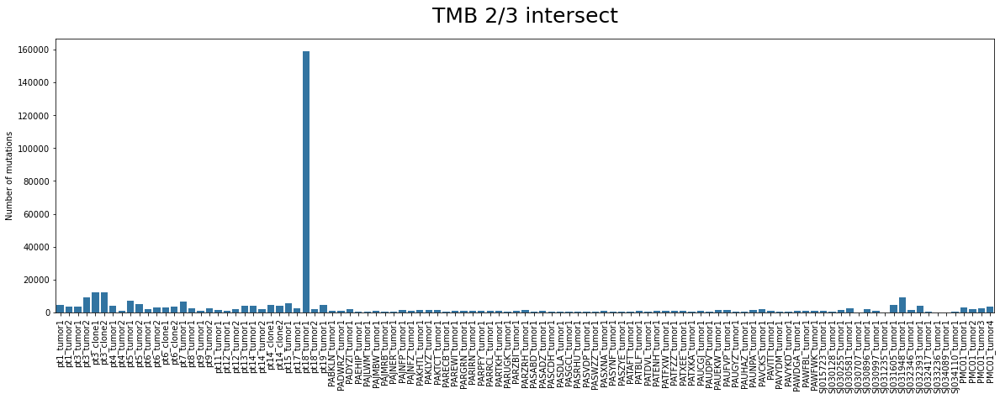

In [31]:
sample_final = {}
for sample_id in df_dict:
    if 'intersect' in sample_id:        
        sample_df = df_dict[sample_id]
        sample_id2 = sample_id.split('_intersect')[0]
        sample_final[sample_id2] = len(sample_df[['#CHROM','POS','REF','ALT']].drop_duplicates())
tum_burden_df = pd.DataFrame.from_dict(sample_final,orient='index',columns=['Number of mutations'])
plt.figure(figsize=(20,6))
sns.barplot(tum_burden_df['Number of mutations'])
plt.title('TMB 2/3 intersect',size=25,pad=20)
plt.xticks(rotation=90)
plt.show()

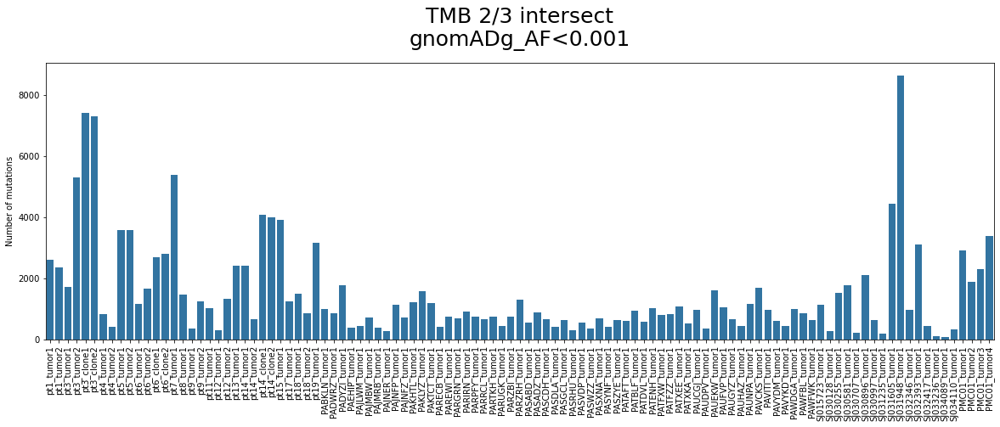

In [32]:
sample_final = {}
for sample_id in df_dict:
    if 'intersect' in sample_id:        
        sample_df = df_dict[sample_id]
        sample_id2 = sample_id.split('_intersect')[0]
        sample_final[sample_id2] = len(sample_df[['#CHROM','POS','REF','ALT']][sample_df['gnomADg_AF']<0.001].drop_duplicates())
tum_burden_df = pd.DataFrame.from_dict(sample_final,orient='index',columns=['Number of mutations'])
plt.figure(figsize=(20,6))
sns.barplot(tum_burden_df['Number of mutations'])
plt.title('TMB 2/3 intersect\ngnomADg_AF<0.001',size=25,pad=20)
plt.xticks(rotation=90)
plt.show()

### Density plots

In [33]:
def density_plot (data,y_var,title=None,sample=None,xlim_min=-0.5,xlim_max=1, bins=100,pur_pos=2,vaf=False,clonality_dict={},purity_dict ={}):
    '''Create density plot for CCF
    input: tumor data, title and xlim max
    output: plot()'''
    
    def slope(data_y,data_x,i):
        slope = (data_y[i+1] - data_y[i]) / (data_x[i+1] - data_x[i])
        return slope
    purity = data['purity'][0]
    data = data[(~data[y_var].isnull())&(data[y_var]<xlim_max)&(data[y_var]>xlim_min)]
    data = data[y_var]
    fig, ax = plt.subplots()
    fig.set_size_inches(5, 2)
    ax = sns.distplot(data,rug=True,bins=bins)
    ax.set_title(title,size=20,pad=20)
    ax.set_xlim(xlim_min,xlim_max)
    
    if vaf==False:
        
        data_x, data_y = ax.lines[0].get_data()
        
        if sample in clonality_dict.keys():
            threshold_x = clonality_dict[sample]
            threshold_y = 0
        else:

            poss = []
            for i in range(len(data_y)-1):
                if i == 0 or i == (len(data_y)-1):
                    pass
                else:
                    if (data_y[i] < data_y[i+1]) and (data_y[i] < data_y[i-1]):
                        poss.append(i)


            poss = [pos for pos in poss if data_x[pos] <1]
            if poss == []:
                pos = 0
            else:
                pos = max(poss)
                
            threshold_x = data_x[pos]
            threshold_y = data_y[pos]
        
        print(threshold_x,threshold_y)

        plt.axhline(y = threshold_y,color='k',linewidth=1,linestyle='--')
        plt.axvline(x = threshold_x,color='k',linewidth=1,linestyle='--')
        plt.text(threshold_x+0.05,data_y.max(),'Clonal',size=14)
        plt.text(pur_pos,data_y.max(),'Purity = '+str(purity),size=12)
        
        return threshold_x

In [34]:
import warnings
warnings.filterwarnings(action='ignore')

0.7256882065464677 0.1301866466677209


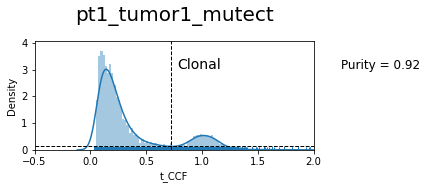

0.72401641816683 0.13850894813354084


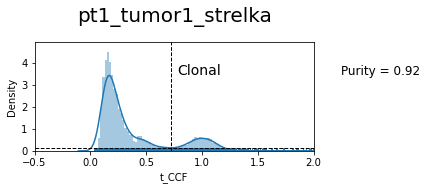

0.5728571485369327 0.25089530055581927


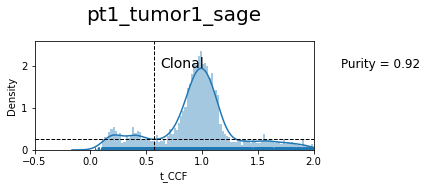

0.48200064508028906 0.10490956937185231


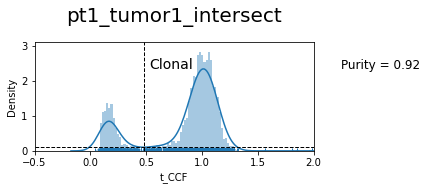

0.49563625413168444 0.2681342307114293


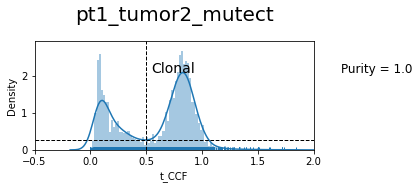

0.5452336207175423 0.42963292369435924


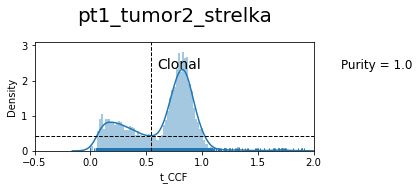

0.4429001592595332 0.2617034629247252


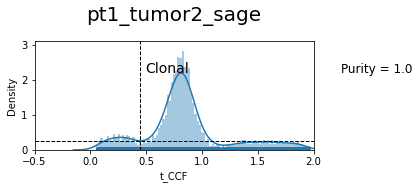

0.48405963033650523 0.07464113680873337


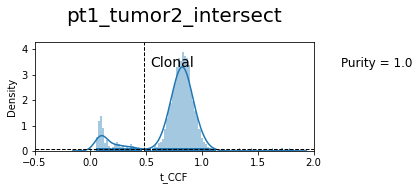

0.7884626139074148 0.20140075804341478


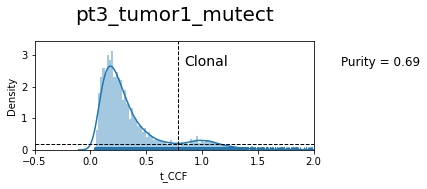

0.7847556655389984 0.39075765417530567


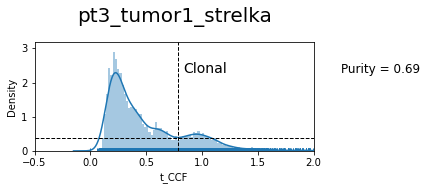

-0.15340918325275918 6.505186248361222e-05


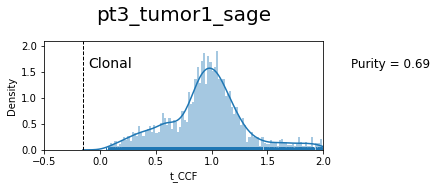

0.5913436416620546 0.209952353685929


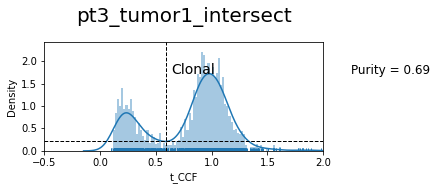

0.6854805134893642 0.1355884192473537


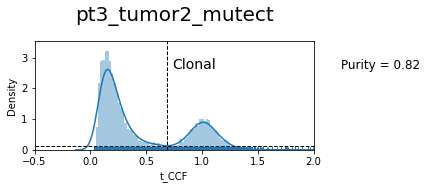

0.6643222702219586 0.23338633421701305


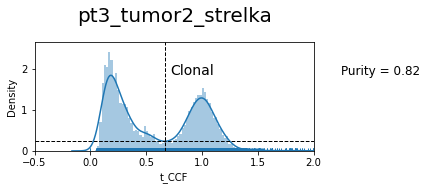

0.5720264773834088 0.2824421630191876


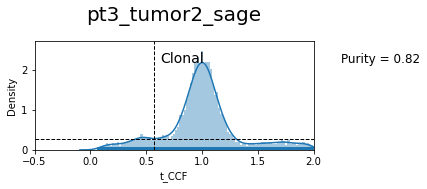

0.40535916391991067 0.0867853802109009


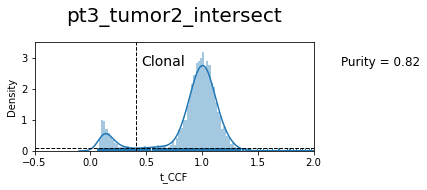

0.49064664588393325 0.19335910455255512


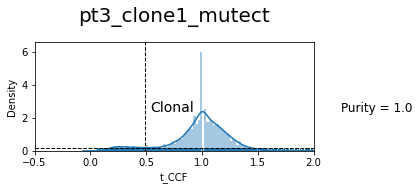

0.5483784033596488 0.36219588870670477


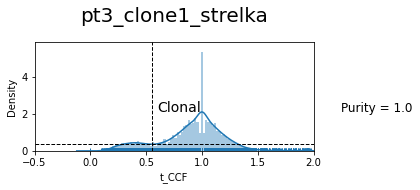

-0.06898336523394905 1.4513802019888558e-05


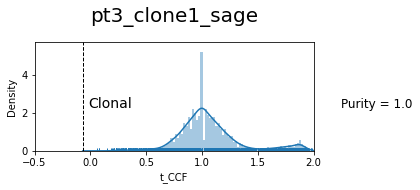

0.48512552893845257 0.14529291798099134


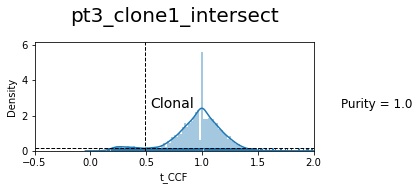

0.5106802421854966 0.15858542592083805


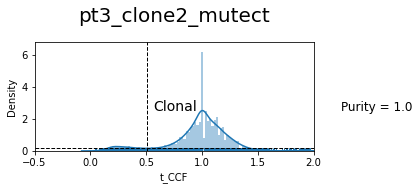

0.5486175088246985 0.3278862599576493


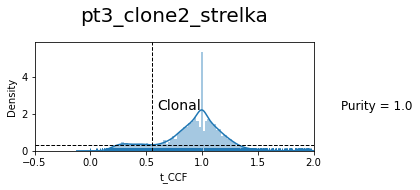

0.4431904005650402 0.050020419044329426


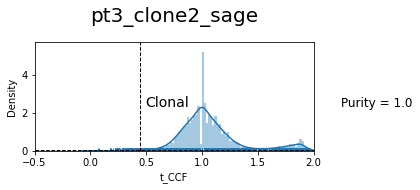

0.4499118137389078 0.1169065922313189


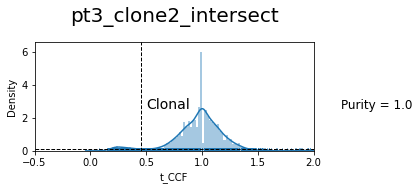

0.767794079006751 0.04469377337266635


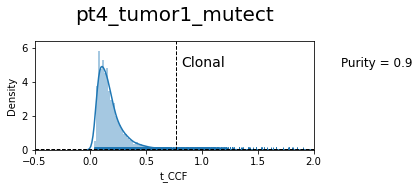

0.9135534958071344 0.1159472113701705


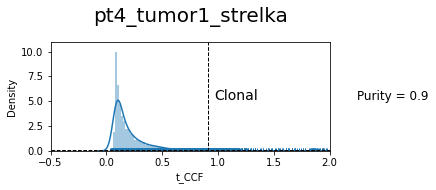

0.7060798266856908 0.23932021964112737


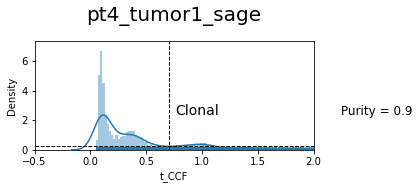

0.6628438576598452 0.14604630504312116


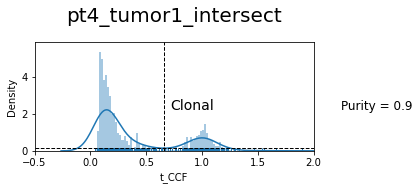

0.7407948533727453 0.2744275697204445


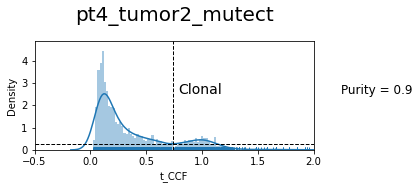

0.7557081445384504 0.5393287240304492


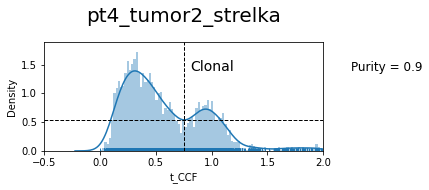

0.6316758154467552 0.5500356459696212


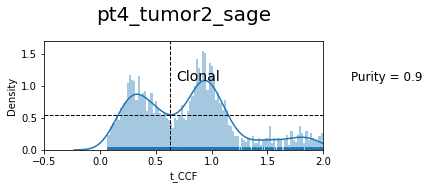

0.6240953910731797 0.34983082976375446


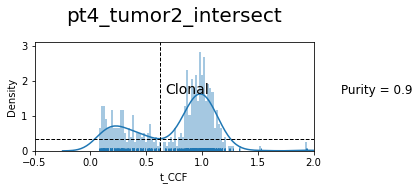

0.6751266630850881 0.13287533224401102


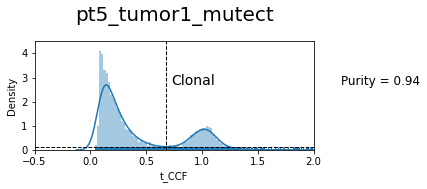

0.6916739104318596 0.12570286050354884


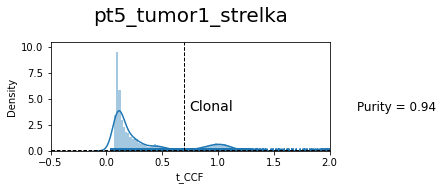

0.5739610020308343 0.2028370504294061


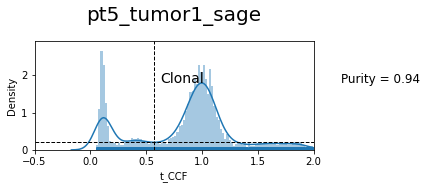

0.5926526787594651 0.07305996118899066


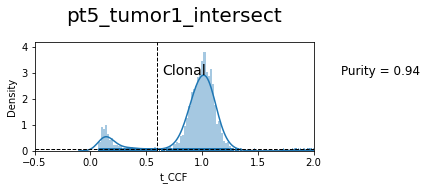

0.6487893766392883 0.3018814747255121


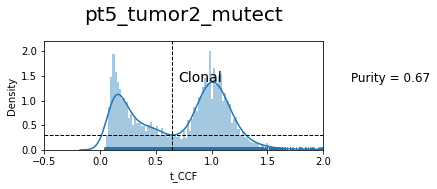

0.6537472385614774 0.4354927246521785


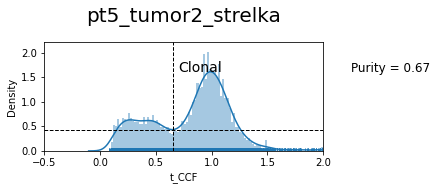

0.6257548961310484 0.377831396637489


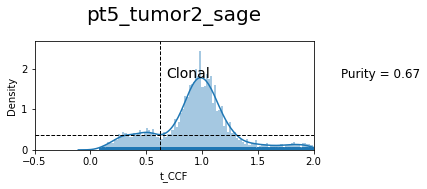

0.6418625956943032 0.27848638630744527


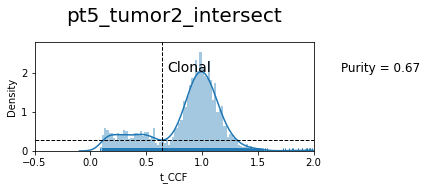

0.6336707474607607 0.33593611345771524


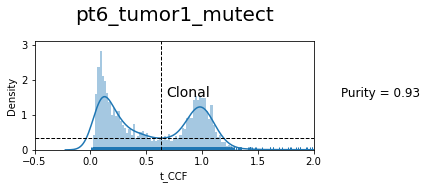

0.6123893118576653 0.4749408942083143


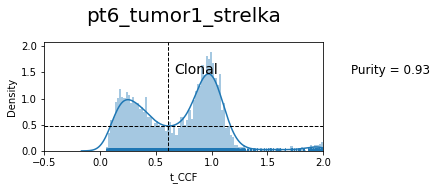

0.5089507710567424 0.31319060430140216


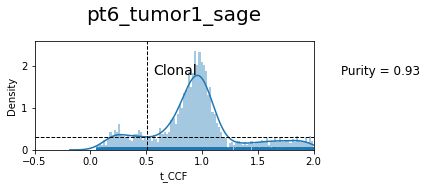

0.3675290823516746 0.0718933968540315


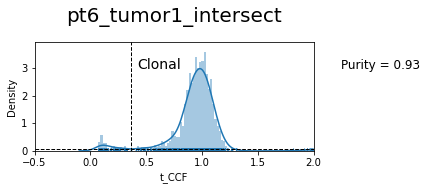

0.7294871774879724 0.12396333675543825


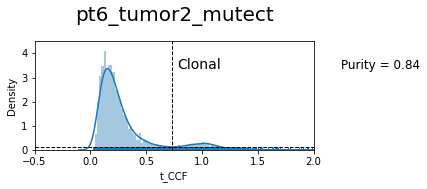

0.7429607700321658 0.22946514760255404


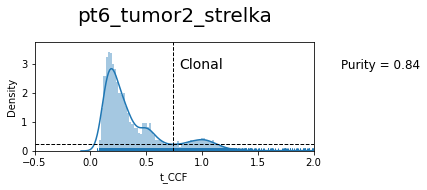

0.6691402452937776 0.5738280955449462


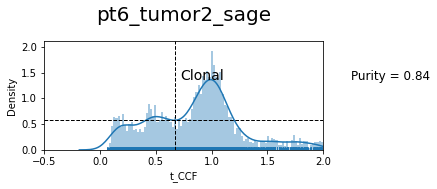

0.5019399724427036 0.27460863896270815


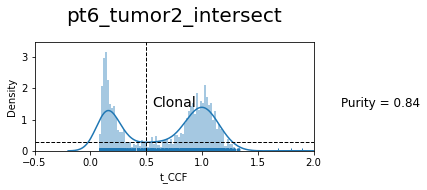

0.4529279447126279 0.4117359214973137


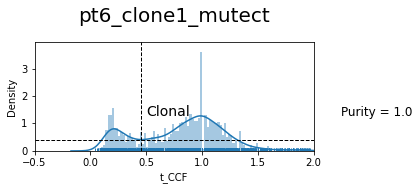

0.5748996577301477 0.6057161607968374


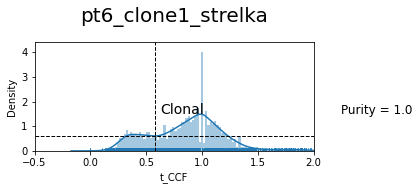

0.23667594296128908 0.005260353945198632


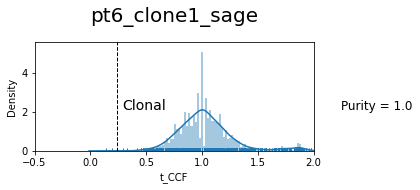

0.3920826509155876 0.11892215882249935


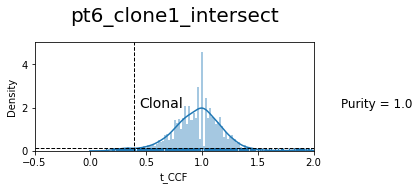

0.48724380229405434 0.357649095827741


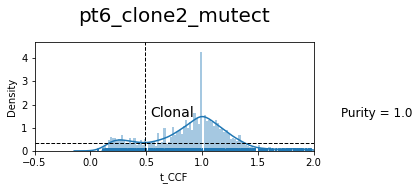

0.5535455245165131 0.5586626443737731


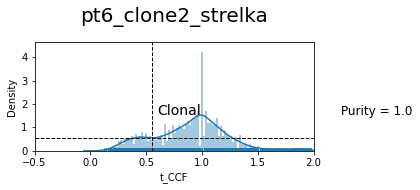

-0.011813825608913392 2.9606505057264617e-05


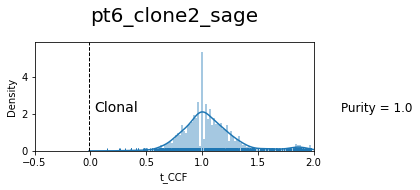

0.04991667569001365 8.549846341183808e-05


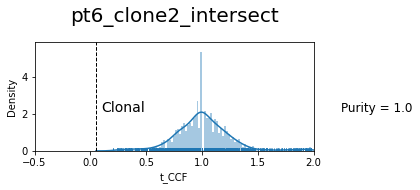

0.019388320461333514 0.0001788956131610602


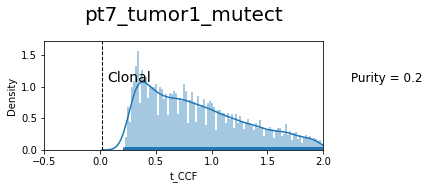

0.5235709548660572 0.7979810897385982


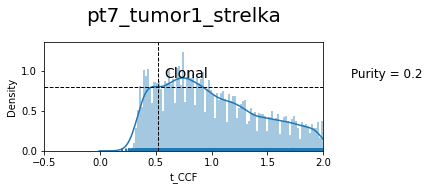

0.02332468472050847 0.0001601362660504786


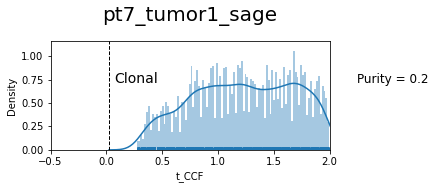

0.6213699547036594 0.5930299479622224


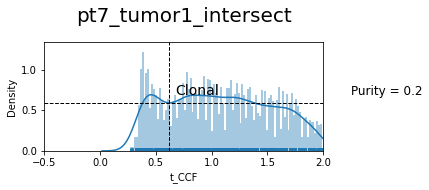

0.9453341647904309 0.030135523770692826


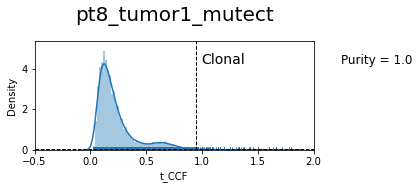

0.5778741943090957 0.48838317508720974


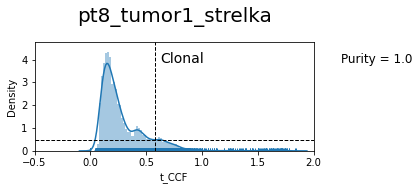

-0.14605245163371916 0.0003181982599209748


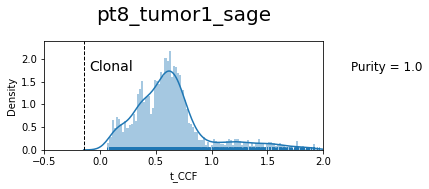

0.3767643218120238 0.35510417351869056


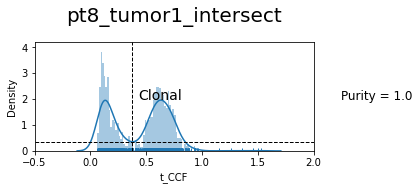

0.9420257039621492 0.01762000289743174


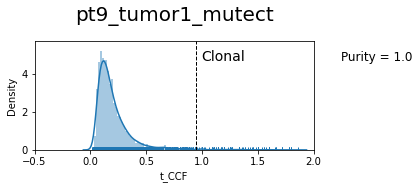

0.9626903077069575 0.03376492135343524


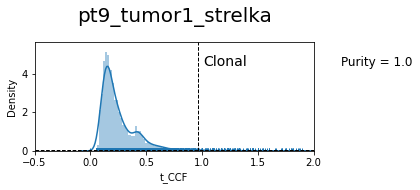

0.9366943233318658 0.2128198801293611


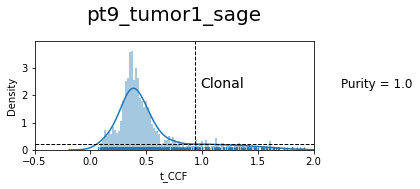

0.6858752755412156 0.14922512054515577


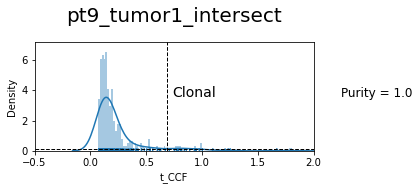

0.896481966816145 0.10009176821279465


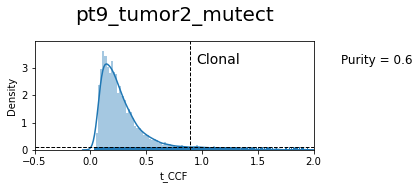

-0.10053911647921968 6.781293460167917e-06


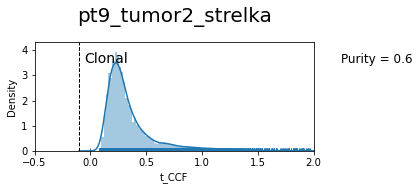

-0.13895719578312116 0.0003123727692055632


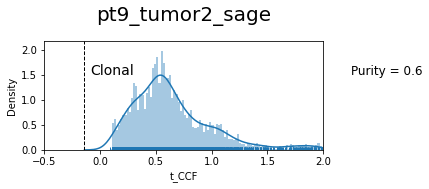

0.687652418452004 0.2157622744045354


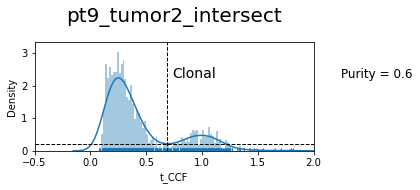

0.7453873328964962 0.2480103591543481


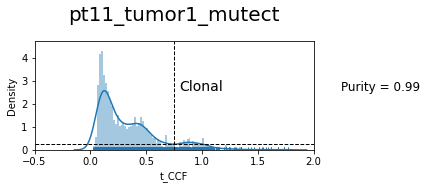

0.755429121368882 0.28314066387677506


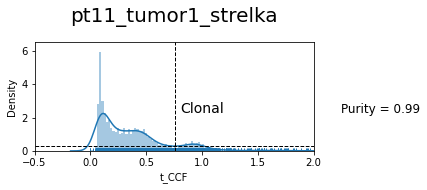

0.7345655569898423 0.4678986988026564


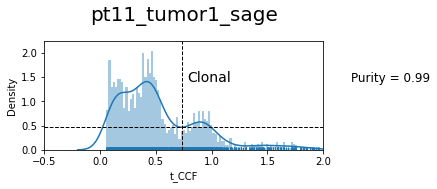

0.7133767393769176 0.2297978759150156


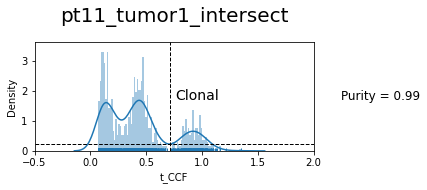

0.9441934821070104 0.014749596889245424


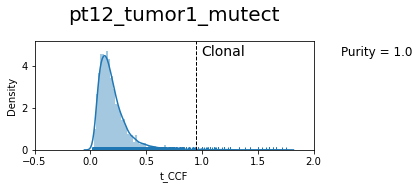

0.9453166180218131 0.019950555175519614


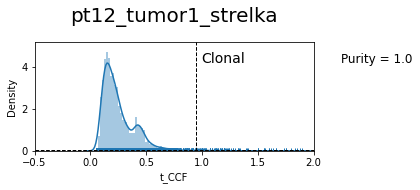

-0.19490825340014895 0.00031512316631068923


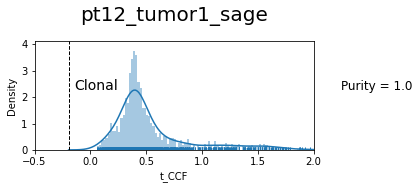

0.7518280417199147 0.04192266288902545


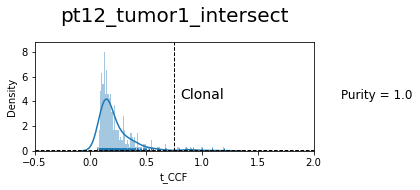

0.6595699154730656 0.28541741732932474


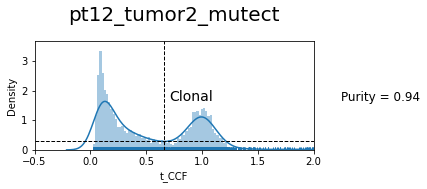

0.664231365203117 0.4597013166099374


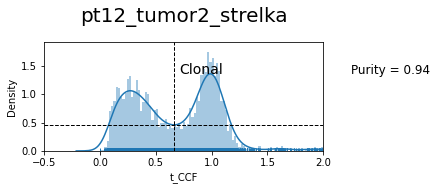

0.5143969335425651 0.3303185715549752


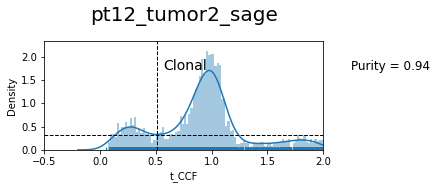

0.4865166270121998 0.09185785085976618


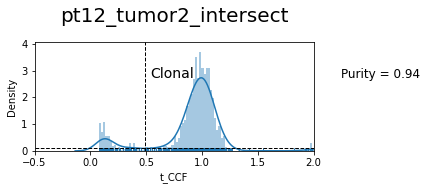

0.8006824322161955 0.0997557880471133


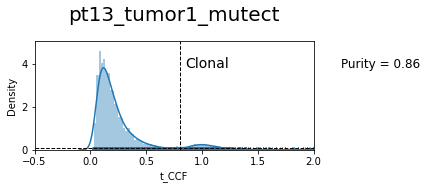

0.711726028834031 0.11280258890421441


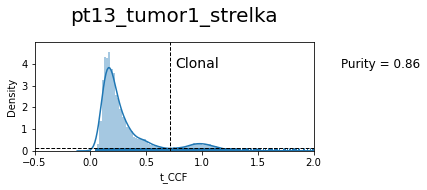

0.6812179994203981 0.3989552374605245


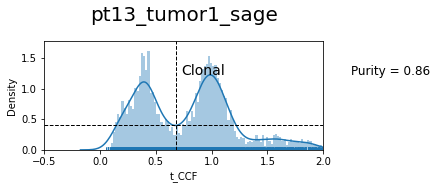

0.6570796433239896 0.15187897842520834


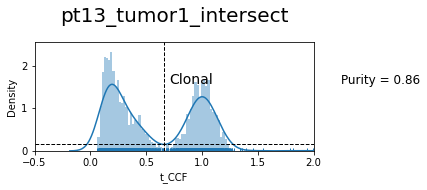

0.7860996285383226 0.3988900598284656


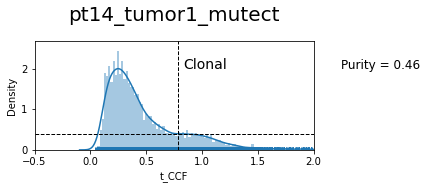

0.7790465744482197 0.621192498732369


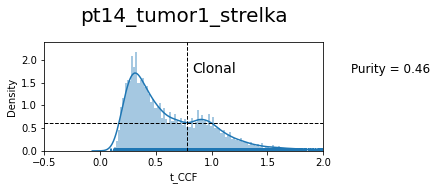

-0.08664056019045978 9.809606736035096e-05


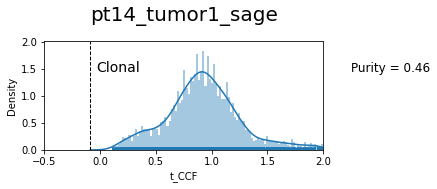

0.5258632665905252 0.3212850924019284


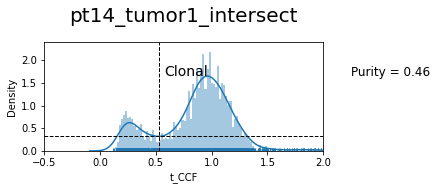

-0.013404305631806751 1.5008032715856246e-05


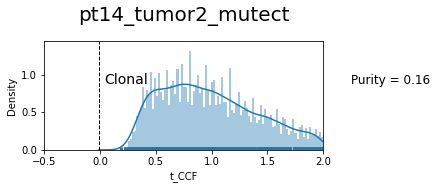

0.15991871333681706 0.0005443786277723819


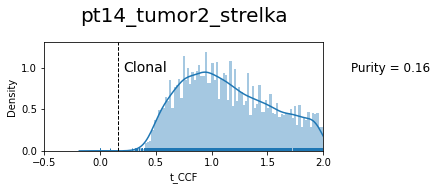

-0.08437714717844691 8.568808563211499e-05


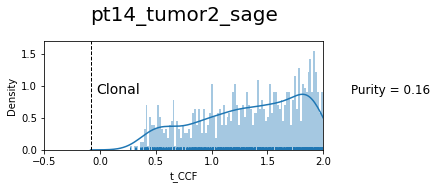

0.048319786698470535 0.0004770049992724741


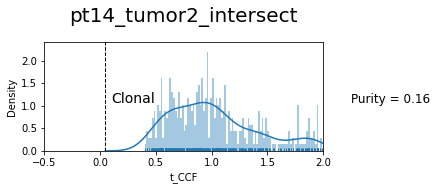

0.5632606956410522 0.3266910945609491


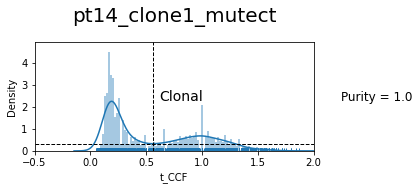

0.59589004923257 0.7754984965306555


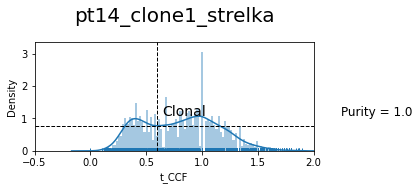

0.3670788642663698 0.019952899327800474


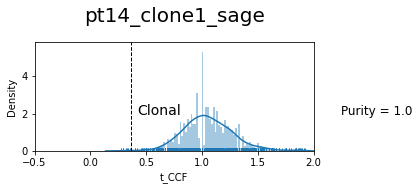

0.017227623748359316 5.1645227050581364e-05


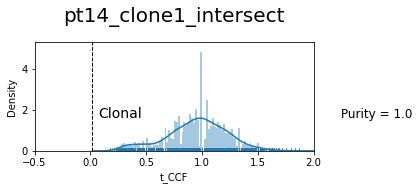

0.5189829857384864 0.48772820155765095


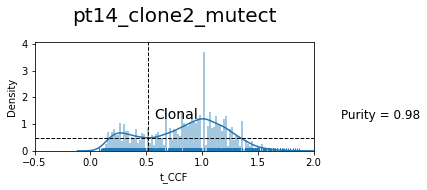

0.6027979218668271 0.7224973669805689


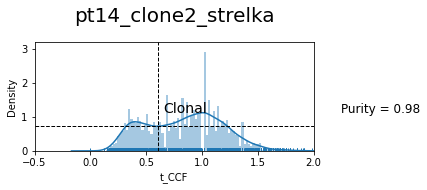

0.3373545377239371 0.004986298767280881


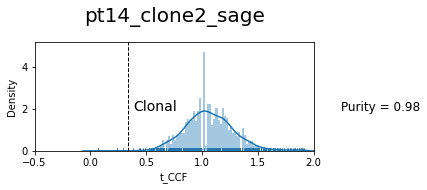

0.06249463453708029 5.417262406485224e-05


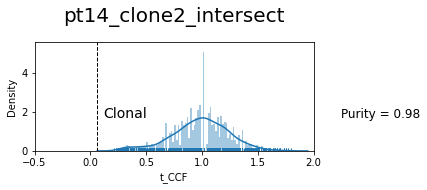

0.6967239401751942 0.34360086651290656


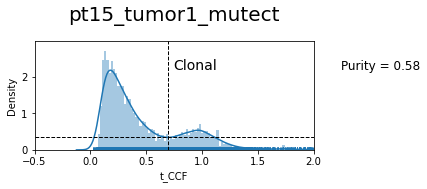

0.6359713239164221 0.49246379538657487


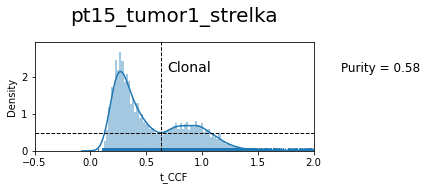

-0.0489032211082813 2.4131357589205957e-05


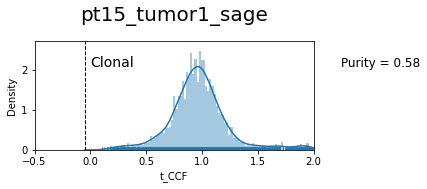

0.49428826307716456 0.14616823918677146


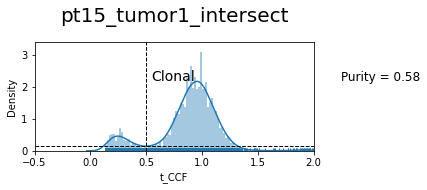

0.8316851797466255 0.09248949588342127


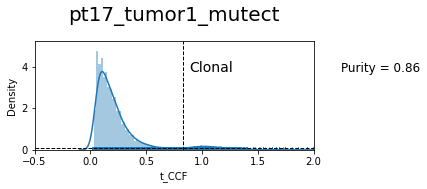

0.7876867026351136 0.19525759849219526


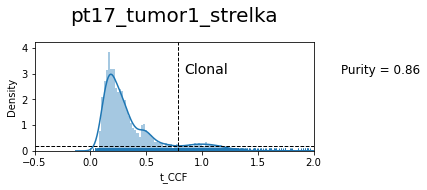

0.7009538269031182 0.5584616057494648


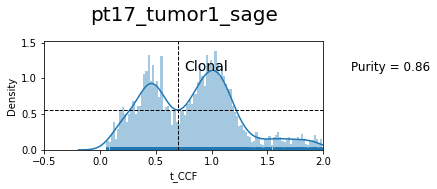

0.5110551402656732 0.2702985765991342


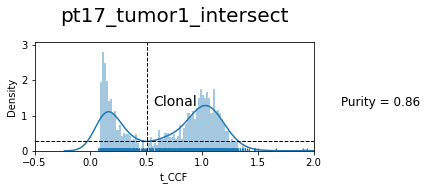

0.8948175989408413 0.3462912255251288


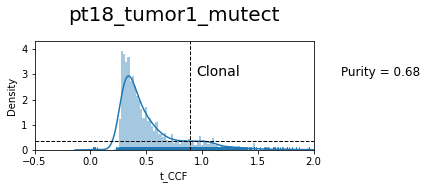

0.9729886671791087 0.004601110803187109


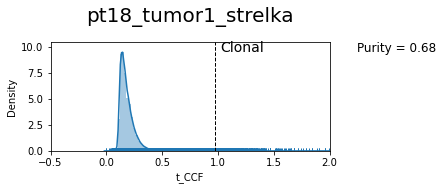

0.952562638171936 0.009160088092480263


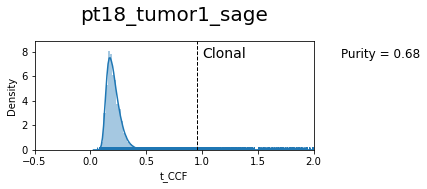

0.6591147553661884 0.1327641867002971


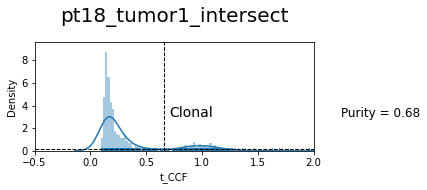

0.9496419861312007 0.07066628701511604


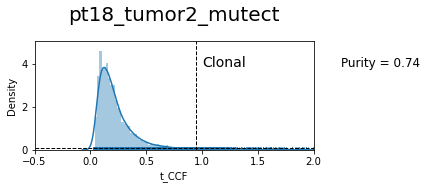

-0.03824590076682602 0.00038401238106952547


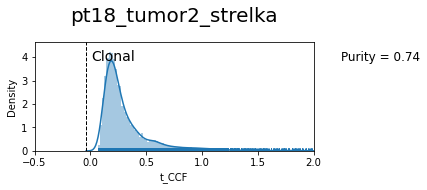

0.8575321818415951 0.5235860596326627


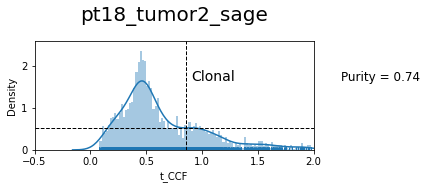

0.7294395959150162 0.21987574662106715


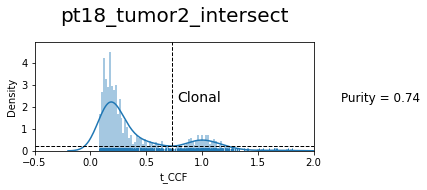

0.7364272729371621 0.07957548430740333


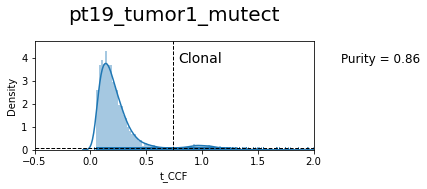

0.7386100345891257 0.14454937929072384


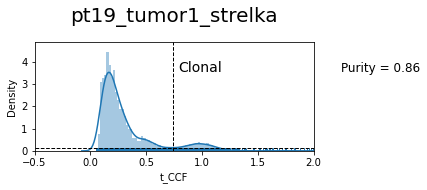

0.6705657082079732 0.3290721616687134


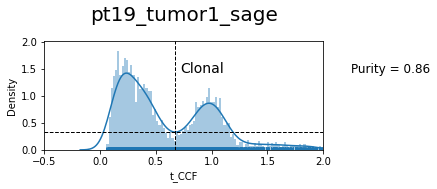

0.5866432460928503 0.06737508732995157


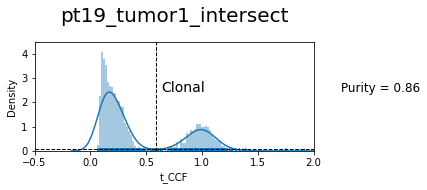

-0.18287180137849546 4.1465102466590365e-05


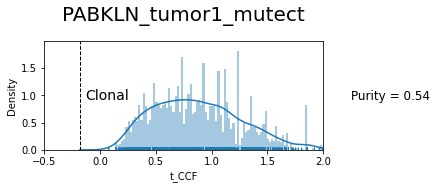

-0.07290857795320838 5.85790031398038e-05


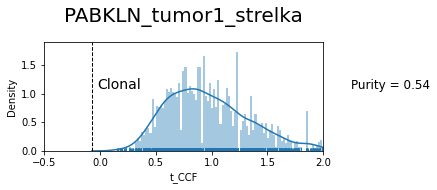

0.166624426980507 9.659248430443323e-05


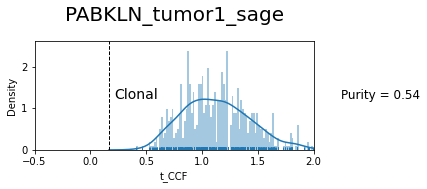

-0.016553830291787558 9.214124138894071e-05


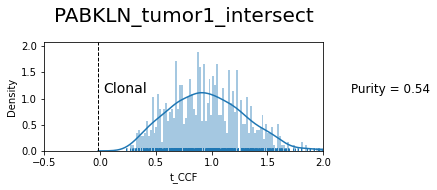

-0.1762007823414074 0.00014694336617364224


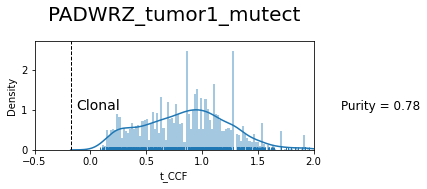

-0.21563790385570442 2.3190276184089623e-05


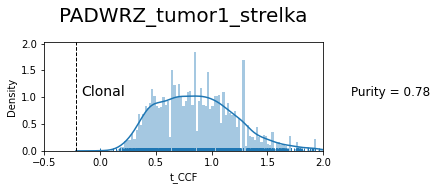

0.29011711560401887 0.016163070509014176


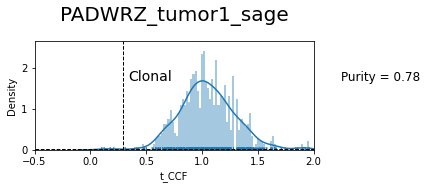

0.38186434396849833 0.20992590020039062


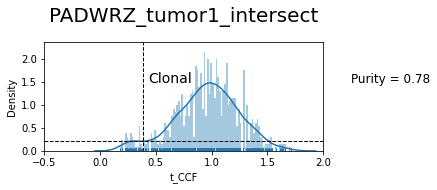

0.5622608280369177 0.542899320331047


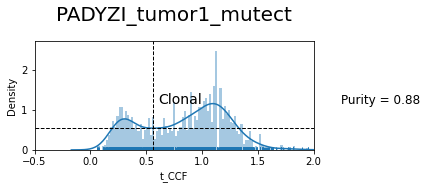

0.7146005118570435 0.7664358375565328


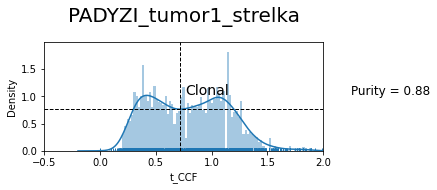

-0.10488253155471886 5.033890050240568e-05


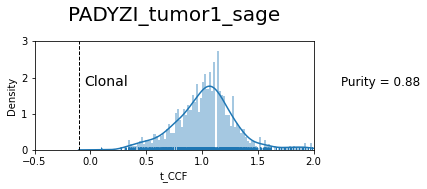

0.5270467758327126 0.38607997932045107


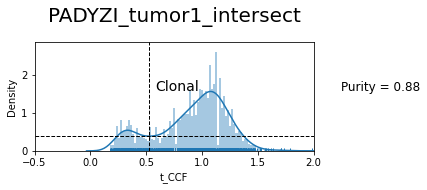

0.7301239409955806 0.8112930899706818


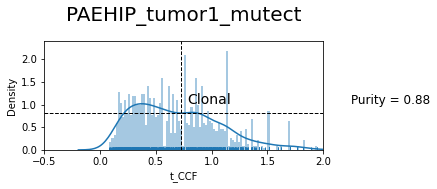

-0.24231744861673443 5.885193715413583e-05


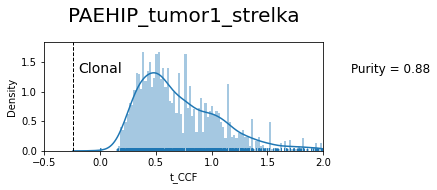

-0.21301766856763013 0.0002454743407983742


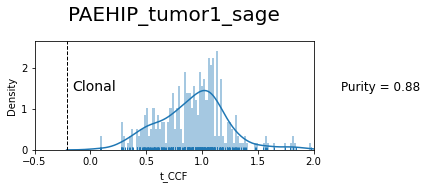

0.6136605920514078 0.7233199565636624


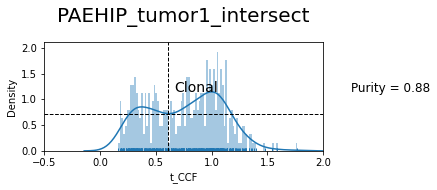

0.6652033962723567 0.6756106076490349


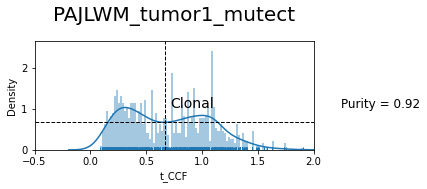

-0.10678553813993943 0.0001457176897185271


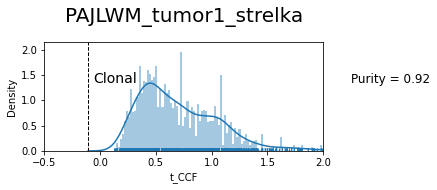

-0.09632073746276815 0.0001354742830317502


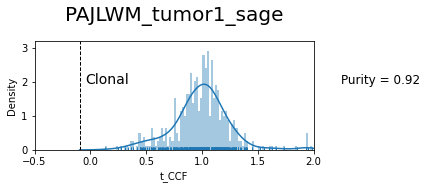

0.5439031937928784 0.4090008516604999


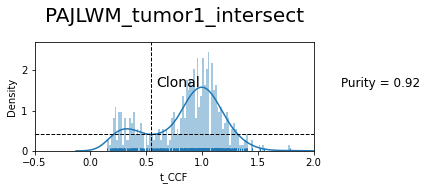

-0.13047006614176793 0.00011346607092006268


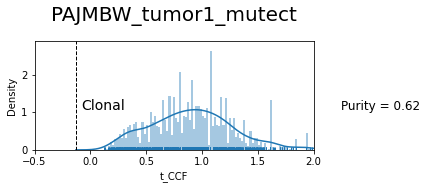

-0.015081347175143256 8.331308350128387e-05


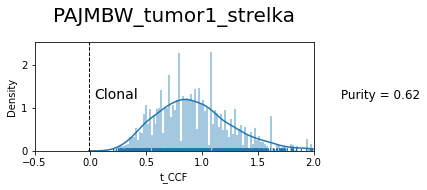

0.19989841245978515 0.010823922164631444


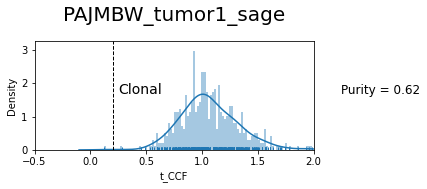

0.04663548620891039 0.0002918307873983441


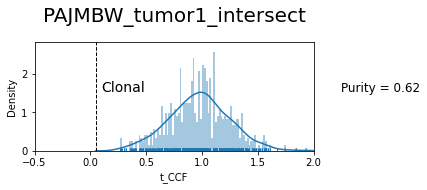

-0.1994581532138252 7.984913067832472e-05


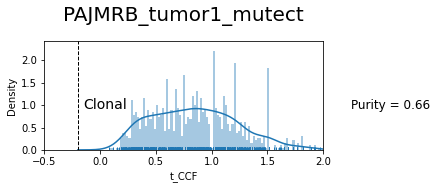

-0.14160500677675686 4.761821267202397e-05


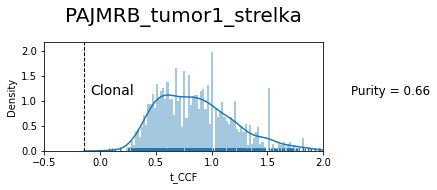

0.34739787279863216 0.03401029427518172


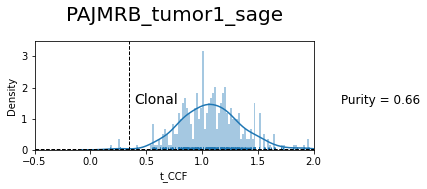

-0.09437365418690796 0.0001395443761850129


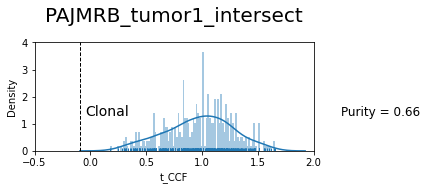

-0.18728262391284112 0.00011654666677679395


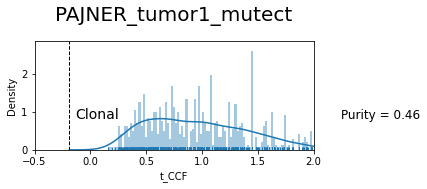

0.785026624983705 0.9375525049355459


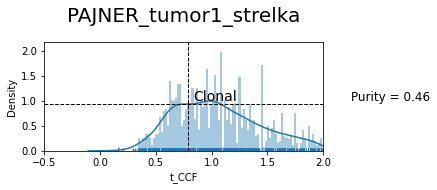

-0.17823498311608924 0.00021745876622527224


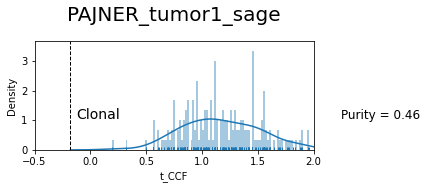

0.8781099590224049 0.8116303607562753


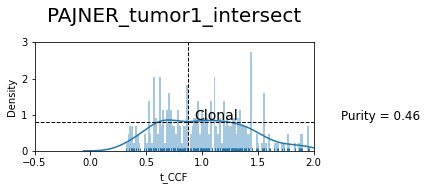

0.6513896860000329 0.7541233535650087


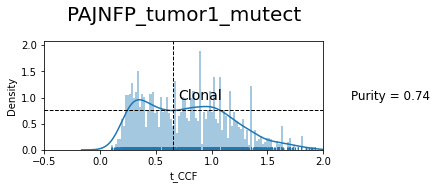

0.7596065401730121 0.9161744037114804


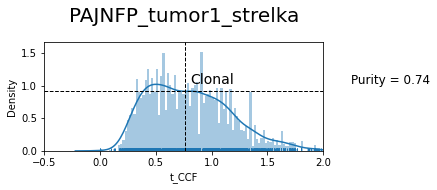

-0.09676058827541995 7.097135829738934e-05


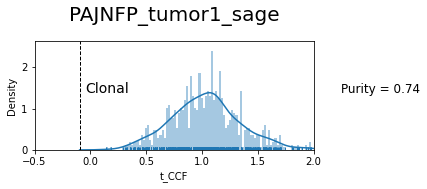

0.5294004973021721 0.6581478757187021


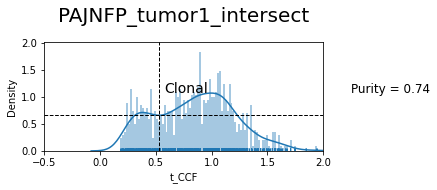

0.5765493691140702 0.8982178011470121


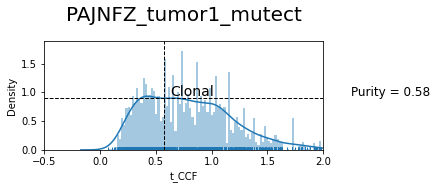

-0.21355213420700658 1.9105188652360387e-05


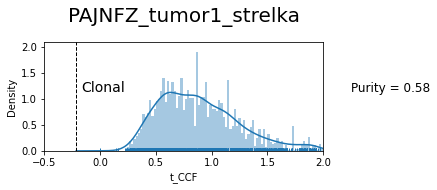

-0.19603811651930791 0.00016371139756736917


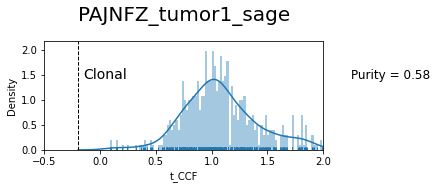

-0.01346959389643676 0.00034081730088391646


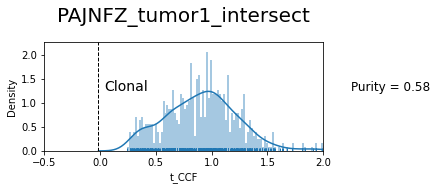

0.4883709280479123 0.490867528836402


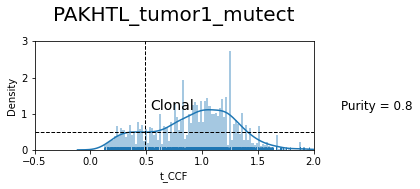

0.6818615032403941 0.7348988488139311


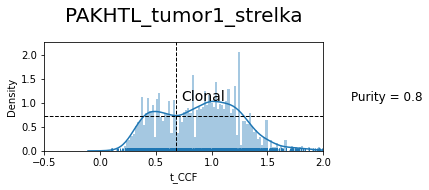

-0.003392938068133039 5.918900954534436e-05


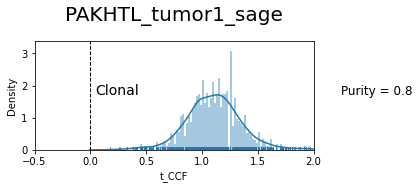

-0.009131186290217225 8.078219852812424e-05


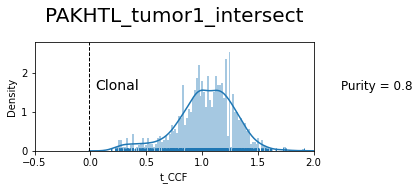

0.5943256496579328 0.6659578921033757


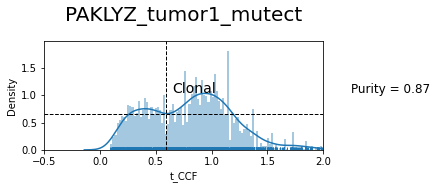

0.5914174476105046 0.8438805335581925


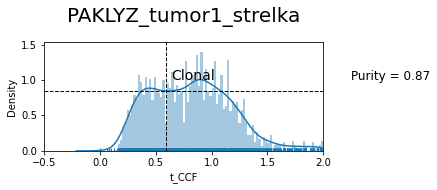

0.17744992981928523 0.01767512075817359


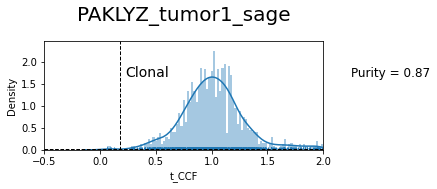

0.5422016475549726 0.39399002140221057


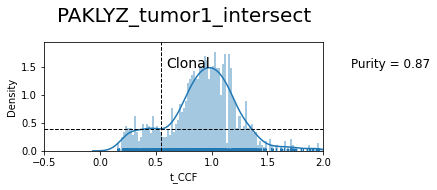

0.4388682008874878 0.5279040183710019


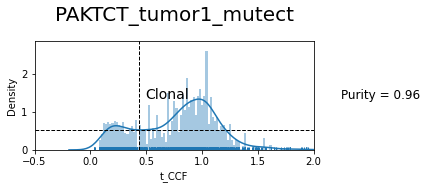

0.5786003348185775 0.7792220307438982


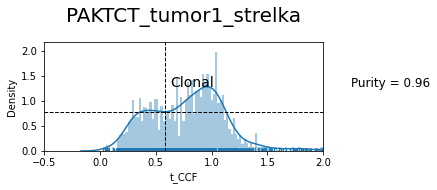

0.4439272159907558 0.046143736315996255


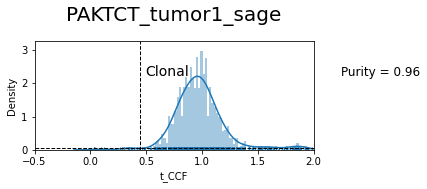

0.4325991680088626 0.12170467995257599


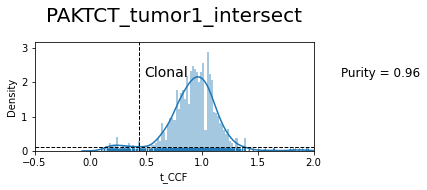

0.6439039528446189 0.783339168741576


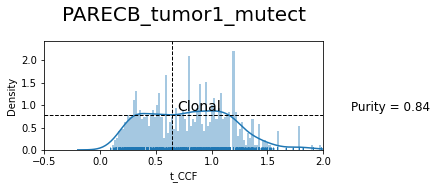

-0.16481908103733936 6.841191217614371e-05


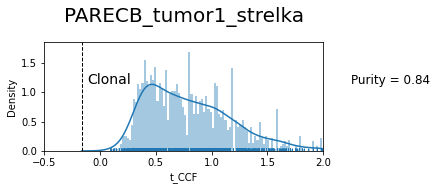

0.13847686376745139 0.00028928232159651876


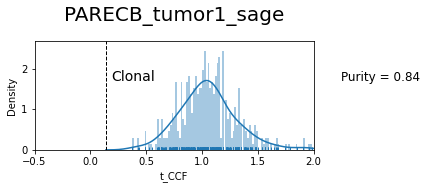

-0.04539465660742703 0.0003770249760051622


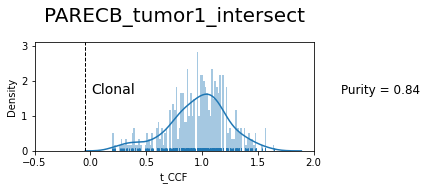

0.7032857485115628 0.6733366031759676


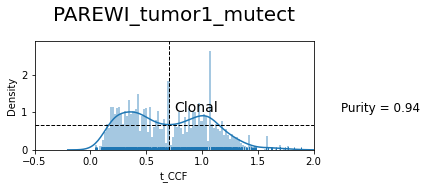

0.7461004696381424 0.7567864238963127


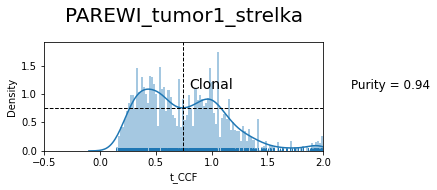

0.574734748405324 0.3388456996496513


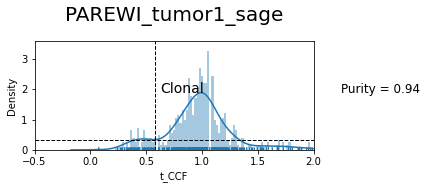

0.6156329332743884 0.45051441996342656


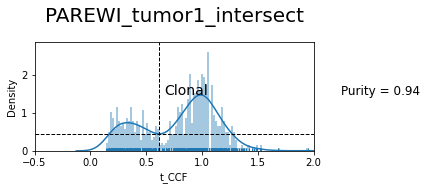

0.6868602921149203 0.660424139759863


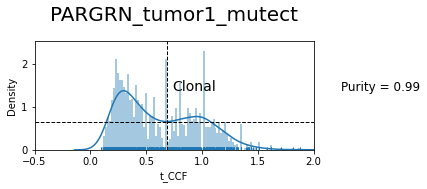

0.7303042367376936 0.656685944109867


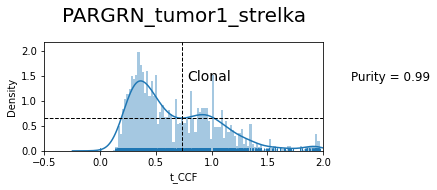

0.5563098621856072 0.2868776999896101


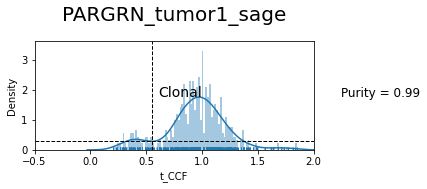

0.6108328652549955 0.3718622487963695


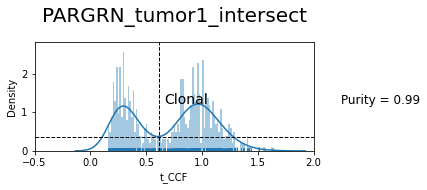

0.7014143800950188 0.6293999902627193


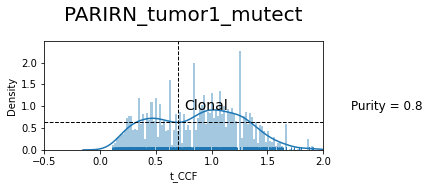

0.8009317254472578 0.8283128778939101


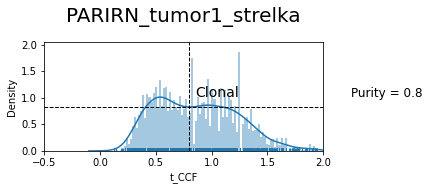

0.2026086967680612 0.002292243796826556


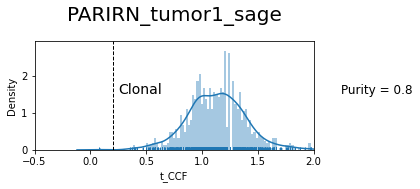

-0.03873374614103306 0.00012584033462032196


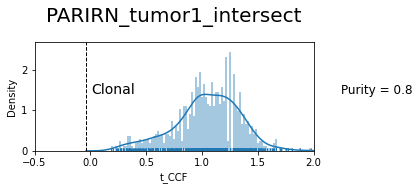

0.642544507409805 0.7093725053438895


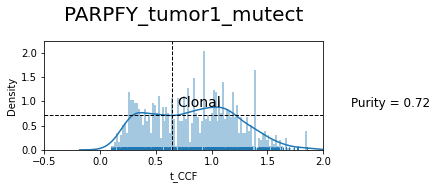

-0.22996589032761883 2.769187814194724e-05


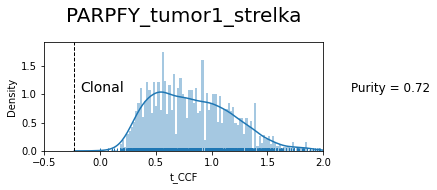

-0.03261900599172446 9.613848243137075e-05


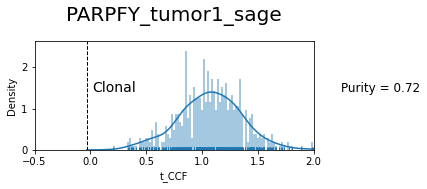

0.5525247130529137 0.4850884523263028


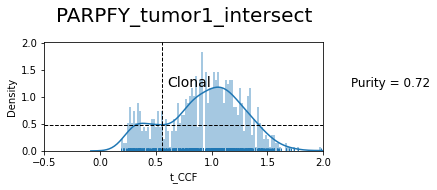

-0.12467291308517814 0.0005785220108828128


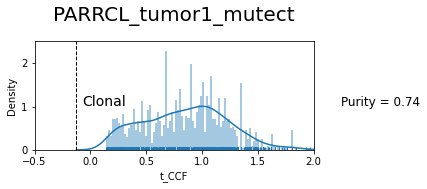

0.7662716808248817 0.8957687536635008


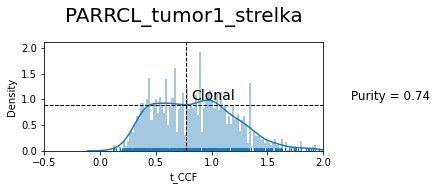

0.18547230919826885 0.00024123233762102762


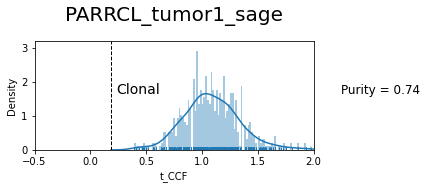

-0.017140887819567158 0.0003220246517354332


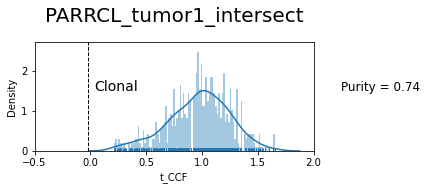

-0.15289396654088405 0.0002057626492046746


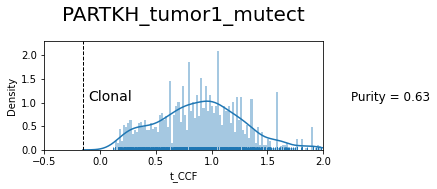

-0.21570990917779298 2.7253631751953266e-05


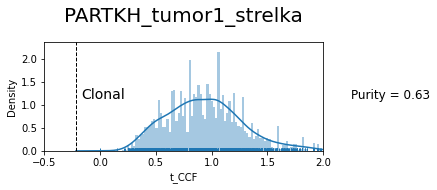

0.28178622659880787 0.00030352896713154375


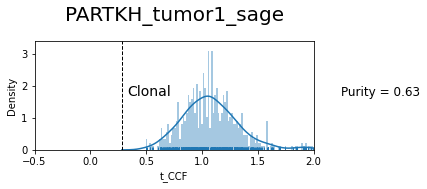

0.02305285229989154 0.00017770429942909148


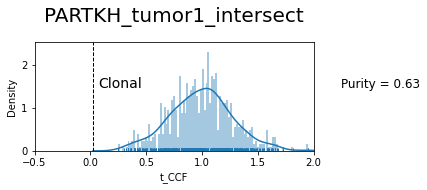

-0.24160497245829787 4.362827438235737e-05


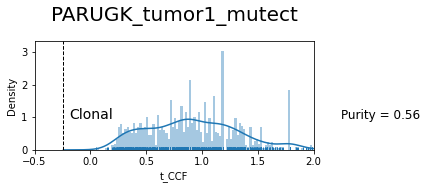

-0.22715539492655787 3.2094950957333666e-05


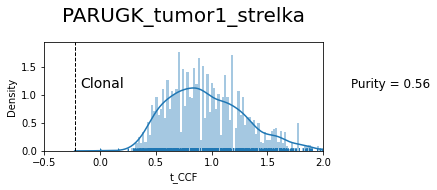

0.27999789499158695 0.02207010867184011


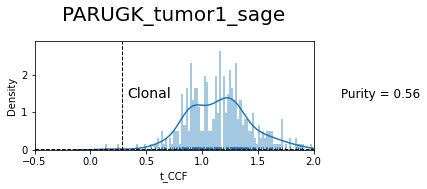

0.02557265095933131 0.0001316364005041894


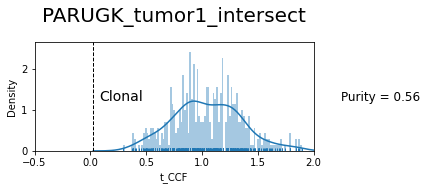

0.8819690537370319 0.8820847017167582


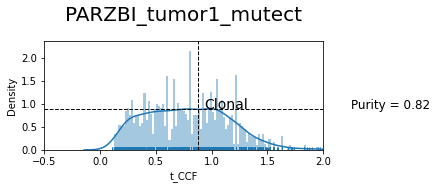

-0.07060236705604514 9.410903889204001e-05


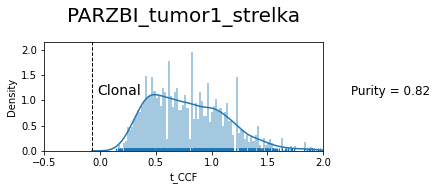

-0.14598614039893676 9.107109165950707e-05


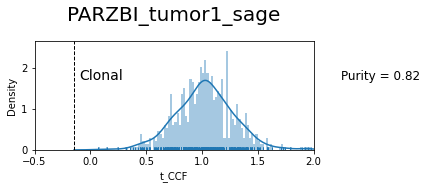

-0.00798853226400456 0.0004223636876733051


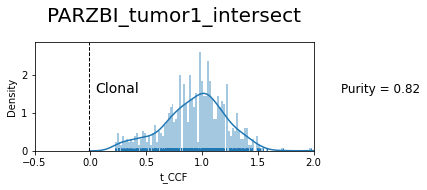

0.3743966875049819 0.4348785088562977


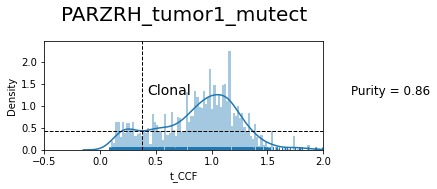

0.5465015153948161 0.682777534659007


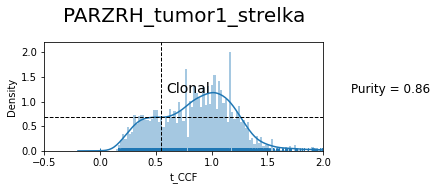

0.19824602123041457 0.006762457956036173


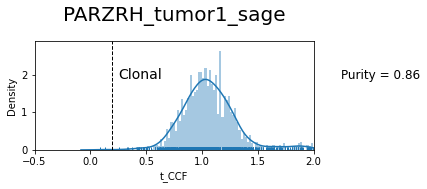

0.405838053395004 0.10326905614591832


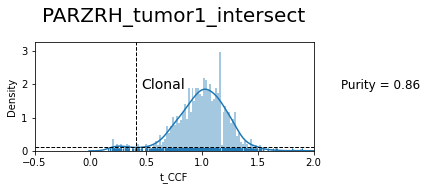

0.5932576580778107 0.8068414036776338


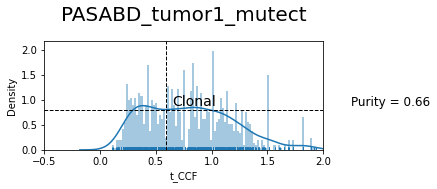

-0.2376994742625453 3.0310668856299017e-05


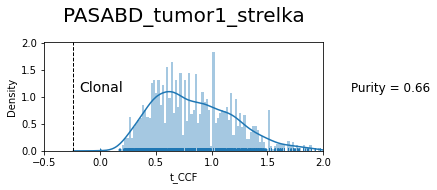

-0.11201655068560762 0.0001475866004316493


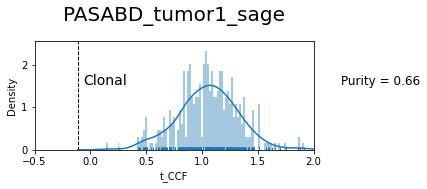

0.5884125115910095 0.6598472191324316


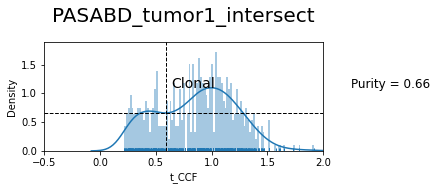

0.6253151407377064 0.6666338324815777


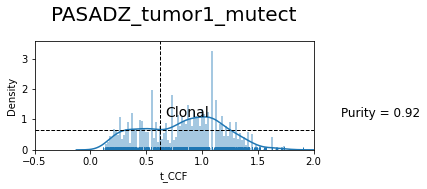

0.6916356537009976 0.8222449653592769


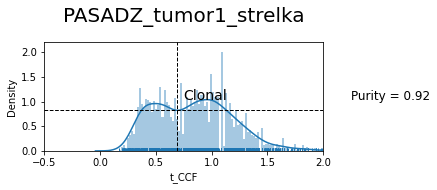

0.21437071897424165 0.005703547931375797


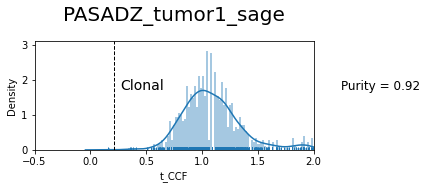

0.46334256400823676 0.12447524683769369


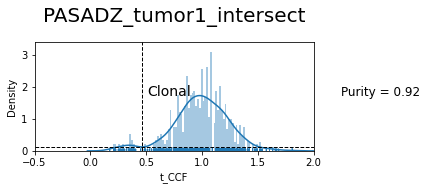

-0.16986000873103133 0.00016111293690487458


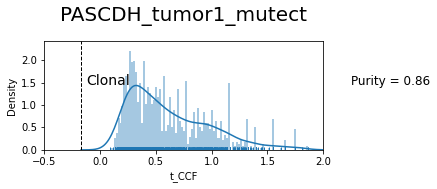

-0.15127839864516404 6.161238911463425e-05


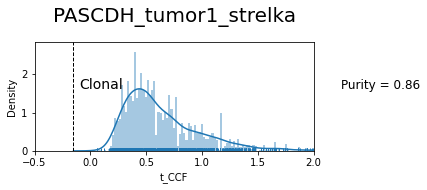

0.04310434633879301 0.00043830522180794327


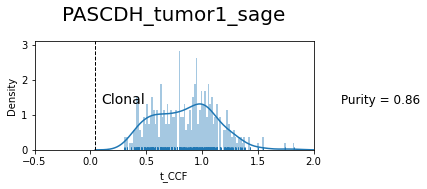

0.8248458237562758 0.6667938765972207


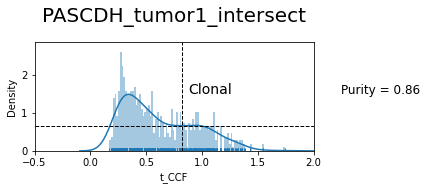

0.7779374772637617 0.6961136839206692


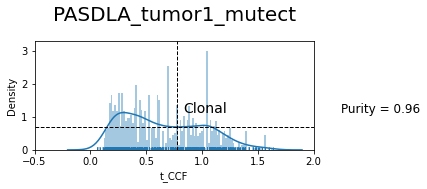

0.8849461489878963 0.6296102802179042


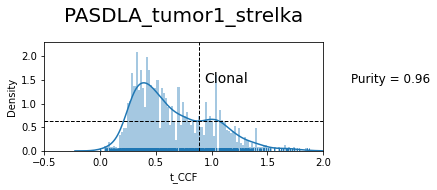

-0.10362603256363884 0.0001402318537695191


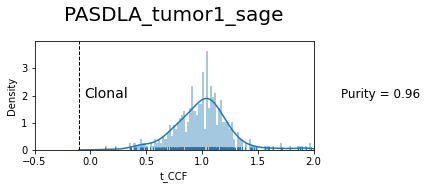

0.508967063973676 0.3136008336634092


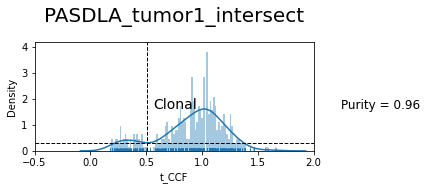

0.5767946936182038 0.5305226793922163


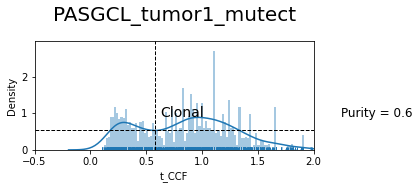

-0.01145259459794179 8.645315980131967e-05


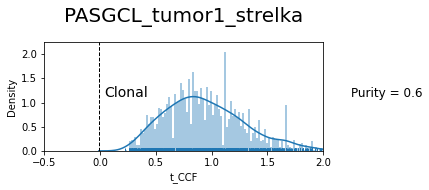

0.23419819535602981 0.015056882060539383


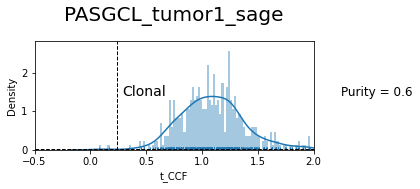

0.028464017508791684 0.00023819182831389874


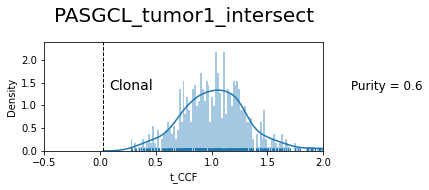

-0.21339207871712906 0.0001962515587251449


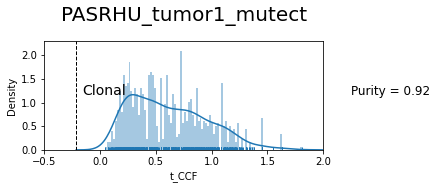

-0.2147270024799699 4.1321280621462794e-05


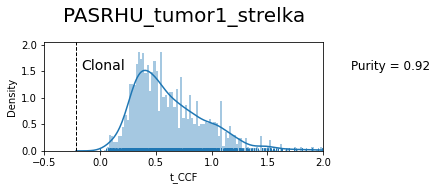

-0.05290816190937972 0.00019800631943296673


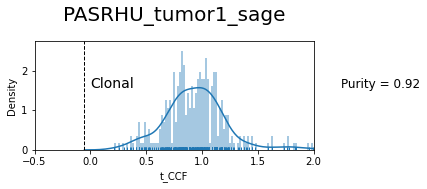

-0.10132573314171031 0.0005311921750545721


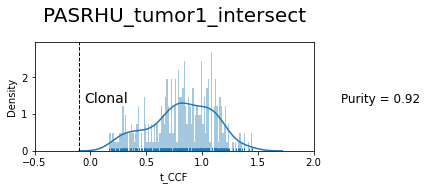

0.5067572261017658 0.6975166560438459


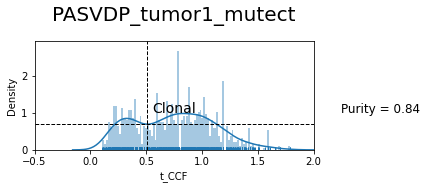

0.6816835560244543 1.0231969950317266


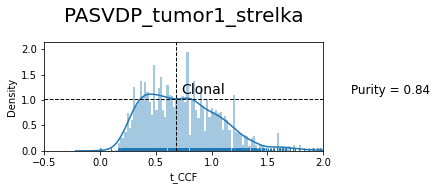

-0.1520801368588846 0.00010414227066134552


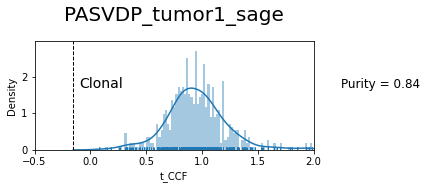

0.46906381792883467 0.31830399895993927


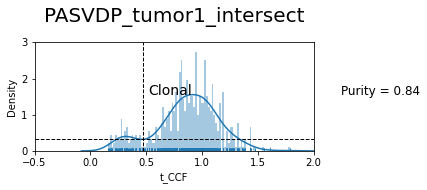

0.7200574521274561 0.6047242465995063


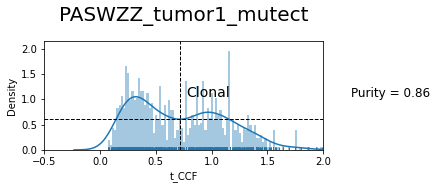

-0.08326980996160599 0.00030461525835481665


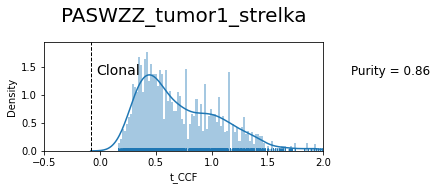

-0.15347773752885452 0.00012448639103632708


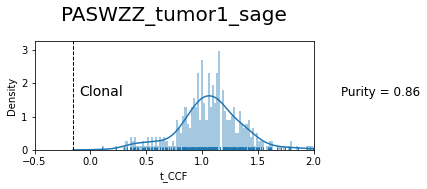

0.5919745817835961 0.3720660076622949


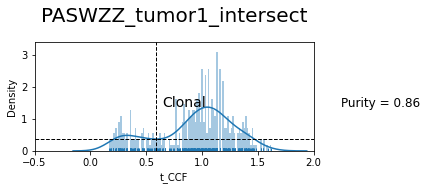

0.5011383041613828 0.5665048600158034


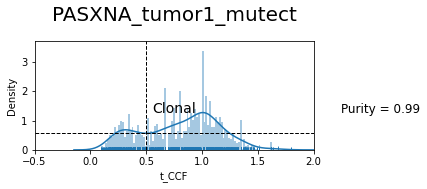

0.6855196288552131 0.7749101998717803


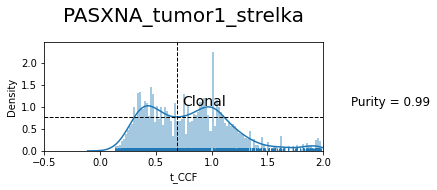

0.40917084107267737 0.0400375294556016


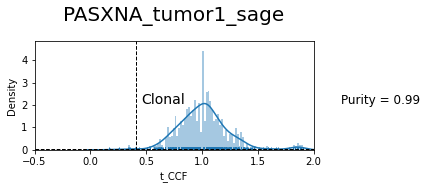

0.4258446244929238 0.13993936171907675


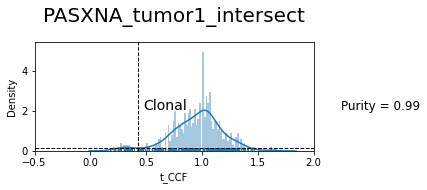

-0.1513482007697825 0.00044632673223131305


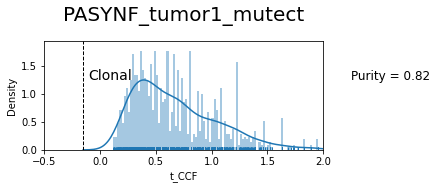

-0.2159825564295202 3.5163806649495716e-05


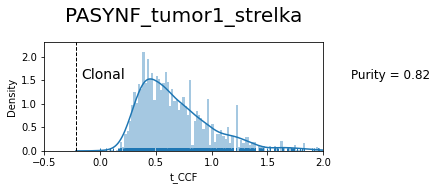

0.8038133104085279 0.9787563000419837


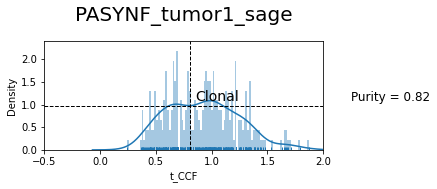

-0.12290806824275824 0.00043734694982200314


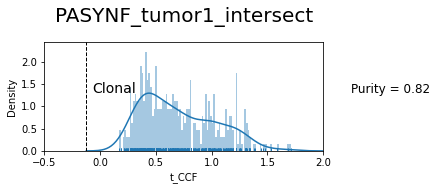

0.8219633743519354 0.9257893849542473


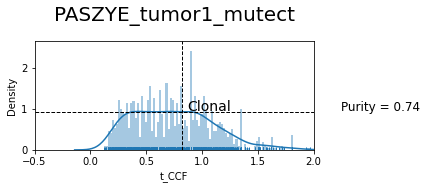

-0.10579254104044034 5.522318571138903e-05


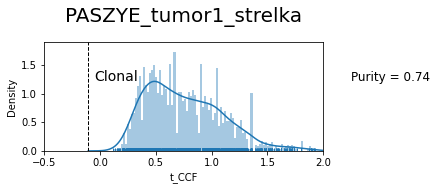

0.10134270795440403 0.00016147388100560612


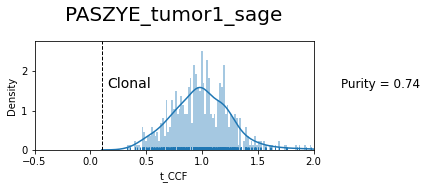

-0.055488456089742066 0.00034683371931632927


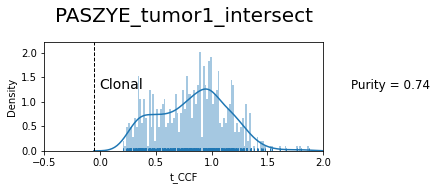

0.5914157638110481 0.8101711957060194


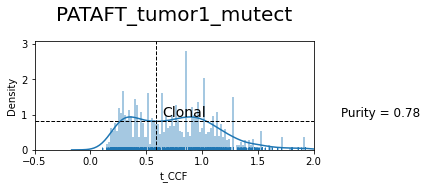

-0.12746204497638888 6.059268853960577e-05


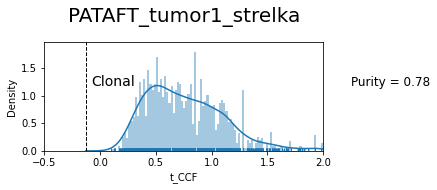

-0.057730083957379996 0.00015245099573659294


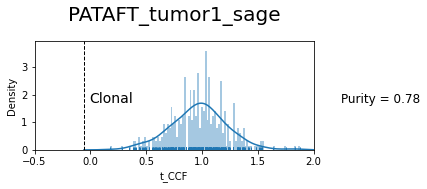

0.5377843760445342 0.5943589933526292


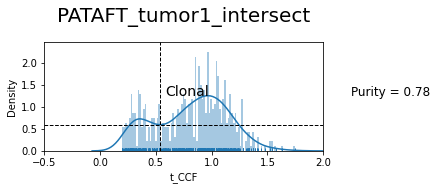

-0.09076693768238062 0.00027614230786236315


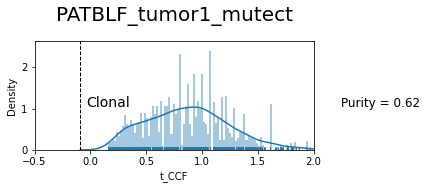

-0.07257646797286169 6.911901669317383e-05


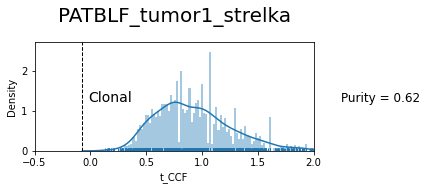

0.13331345851872 0.0001086671603889327


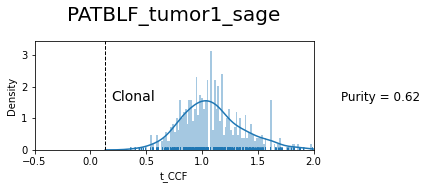

0.02137681686288803 0.00017957599558384574


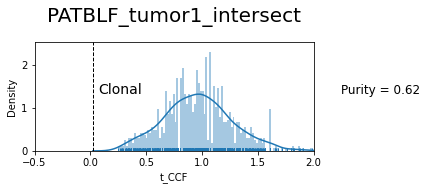

0.6809853274927777 0.6697524359079123


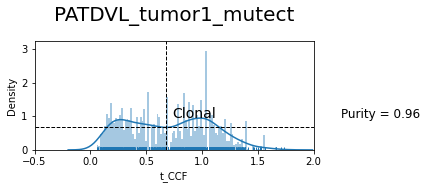

0.7333383395065295 0.8050736763127146


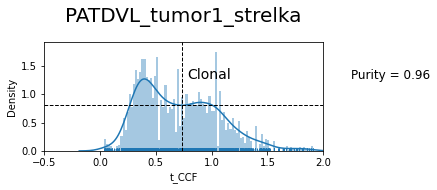

-0.05608696772623867 0.00016784542893937316


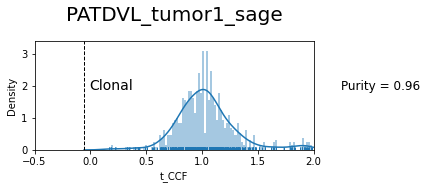

0.45386009282494855 0.14945874470974813


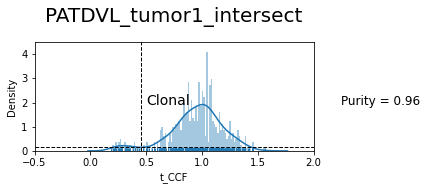

-0.17932815823627674 5.923447440104427e-05


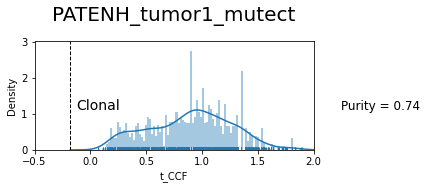

0.6922783741893831 0.8444888810695322


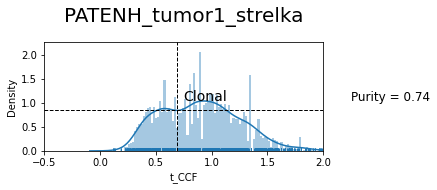

0.26695359387161977 0.002333345317147145


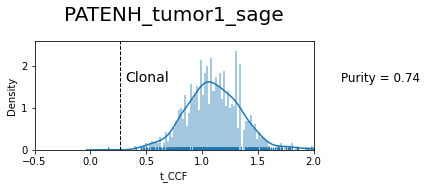

-0.04998310396043251 6.924184304115896e-05


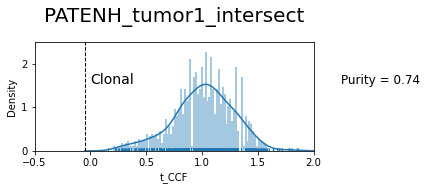

0.6291783122673462 0.6466679370329469


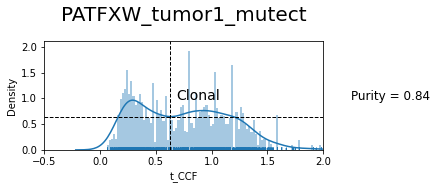

-0.1803515114222271 4.7673727340697744e-05


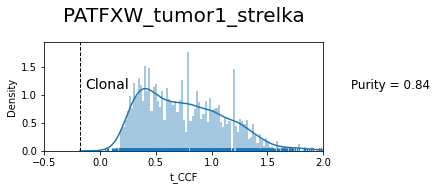

-0.10825480725754393 7.96962902338843e-05


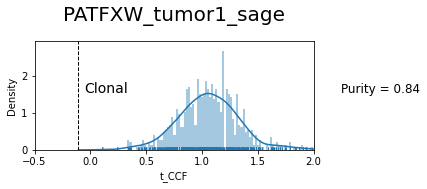

0.4920719720260124 0.3718966553715821


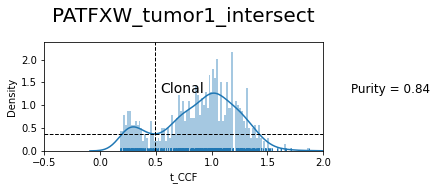

0.5766823538022776 0.7941102567674814


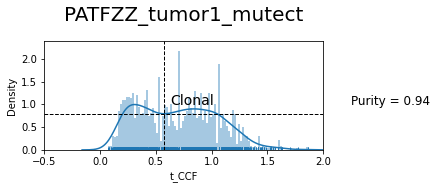

-0.21035055738553246 2.7321811436582763e-05


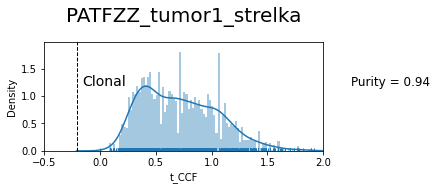

0.01433858658148579 0.0002609176953497943


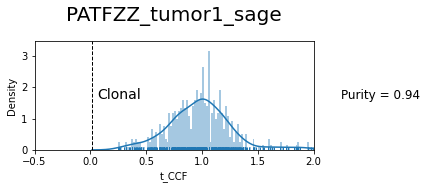

0.4759166771226876 0.45496518183515566


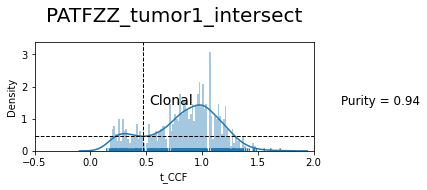

0.7904866533787684 0.719202163330998


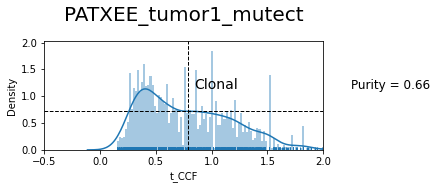

-0.09115369677560461 7.450734371890964e-05


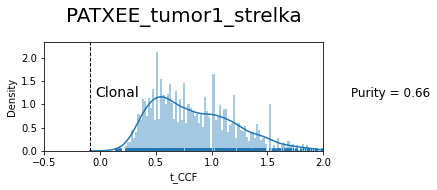

0.18583011696604057 0.0070962396142550555


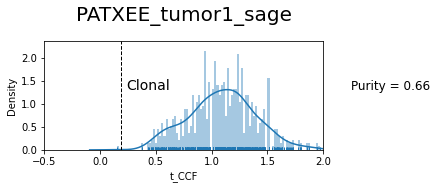

0.7334083946904887 0.6861348086699244


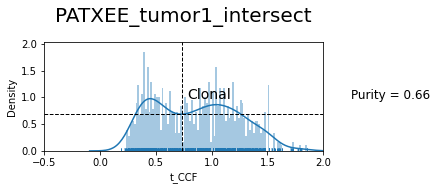

-0.19619410889612357 7.440891428394565e-05


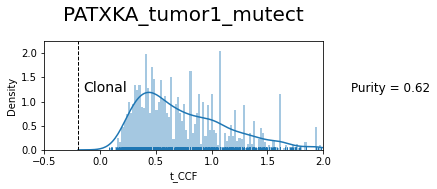

-0.23712421045335322 2.4624119130052824e-05


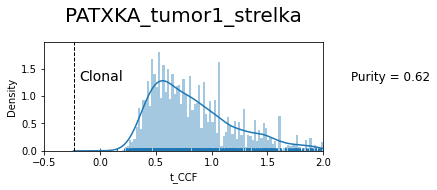

0.04664533019945527 0.0004778194702151188


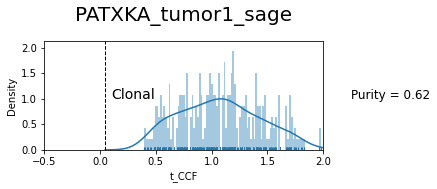

-0.11385590057965778 0.00031199189807328784


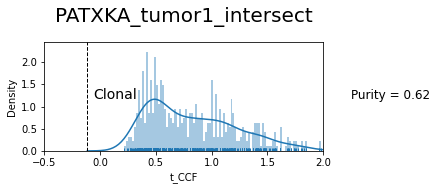

-0.16938652471034343 0.00015154045265588305


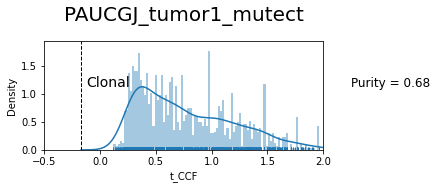

-0.24035597690749538 2.2822077482505525e-05


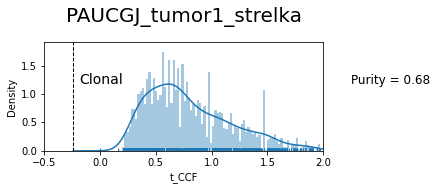

-0.16696139323862505 7.883236127368048e-05


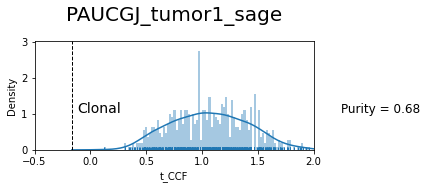

-0.18689277022266995 8.438916290246351e-05


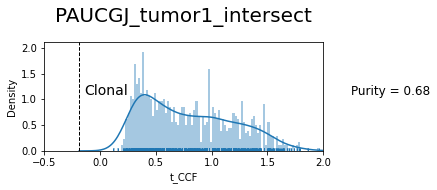

-0.18048125908525725 0.00031253332214109975


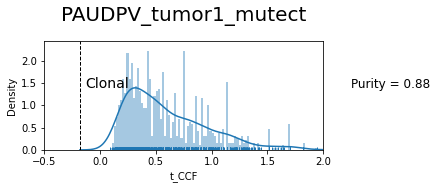

-0.23951123960058676 2.9905725888108342e-05


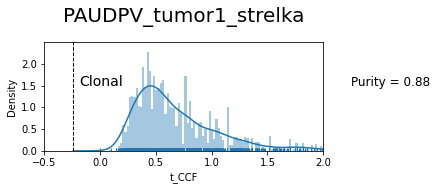

-0.1857062450174225 0.00017355613498075664


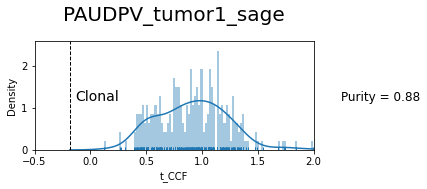

-0.14318222272503092 0.0015161227650877203


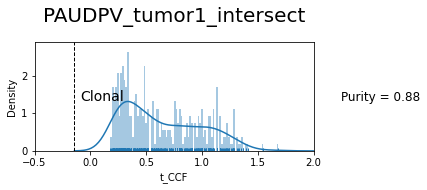

0.4665594904959898 0.4407617065050055


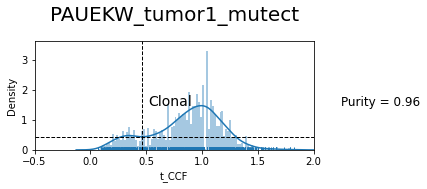

0.6505986722367434 0.7622470215754551


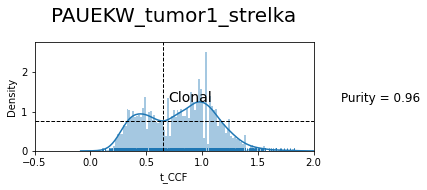

0.016044019272574928 6.06142957905417e-05


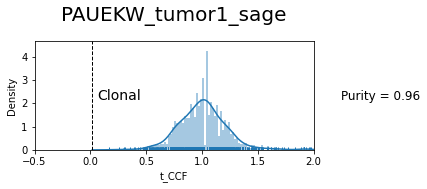

0.40607548824223266 0.12310728281545773


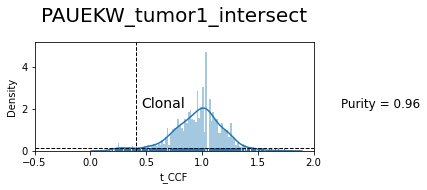

0.559544694621059 0.49136640073558946


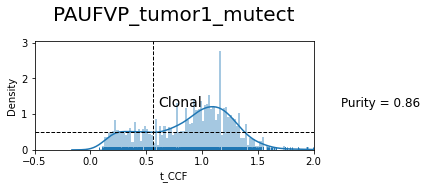

0.6973404711825708 0.6580850219262125


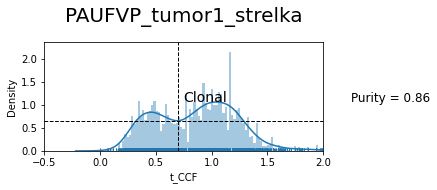

0.08429615195249673 9.547269966442077e-05


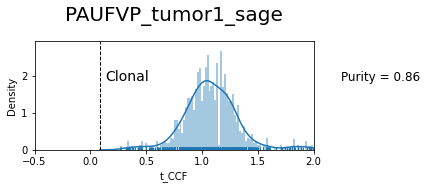

0.556823401279975 0.18409300281238128


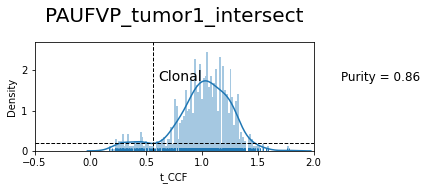

0.5435818218658157 0.6446222934755304


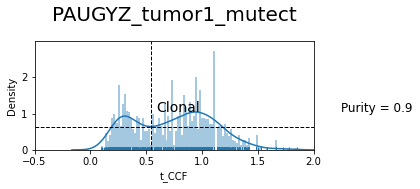

0.8587815090200661 0.9077562901518865


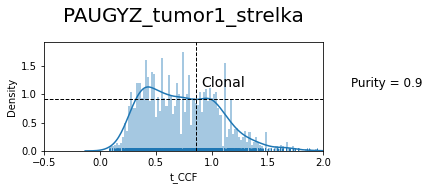

0.0467166426145007 0.0001503605138143135


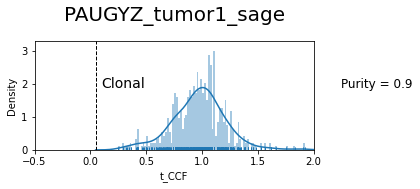

0.5036144940834278 0.36578478673728715


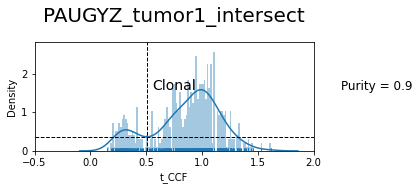

0.5809755725320314 0.7224068624697685


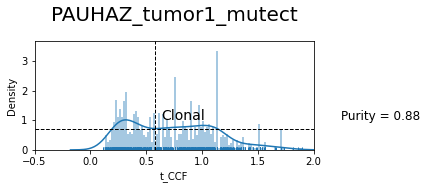

-0.14307326988485441 6.982490820285025e-05


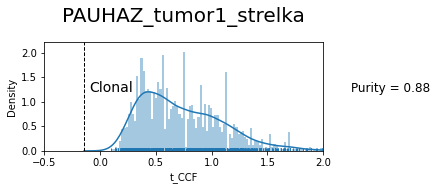

0.18815931818924814 0.03312648931947241


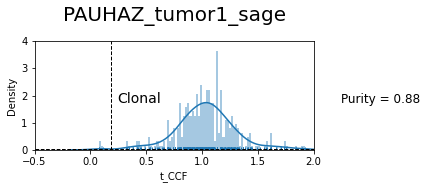

0.5692126901748182 0.4202480227026233


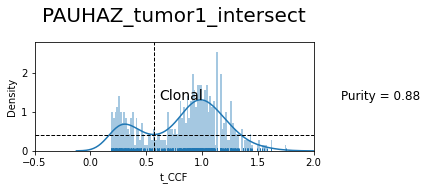

-0.15531882275918357 0.00015224358945078596


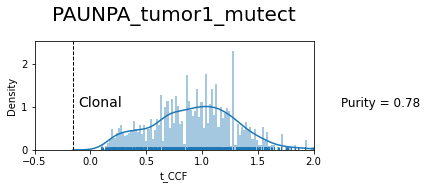

-0.2056114196602471 1.8176090073235037e-05


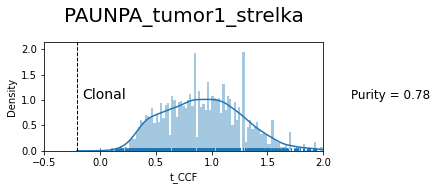

0.17004153844373215 5.9294853001456624e-05


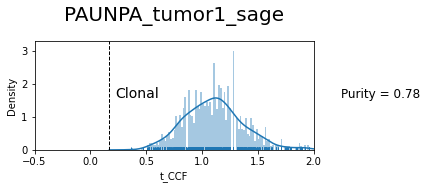

-0.006342892130614286 7.587154617475562e-05


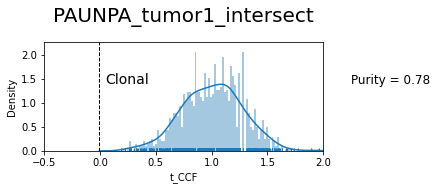

0.387579902815963 0.2914217993374026


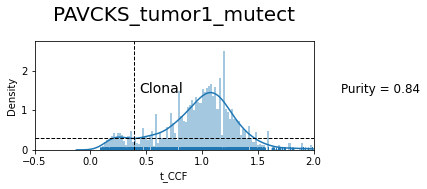

-0.18925178625393999 1.71425387117725e-05


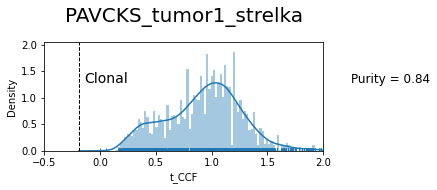

0.4877059600704092 0.025507186574129904


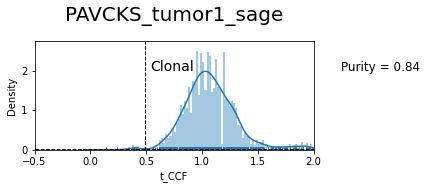

0.4594584272817004 0.08561891222955567


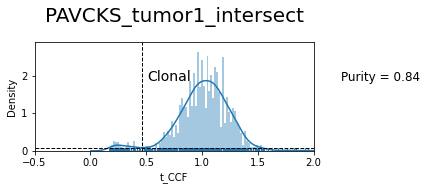

-0.12225080641215129 0.00024296660727815423


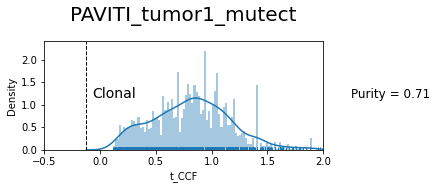

-0.14551738879662363 3.735552946435029e-05


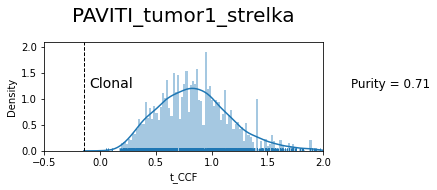

0.1553963450534493 0.014735368909487397


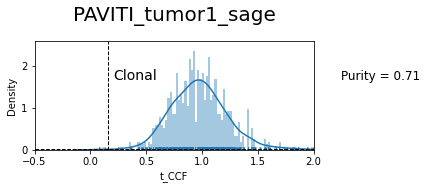

-0.02194231681753786 0.00019563290076286393


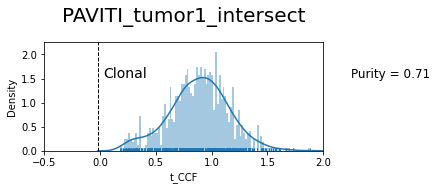

0.6572343805481636 0.8089364550413944


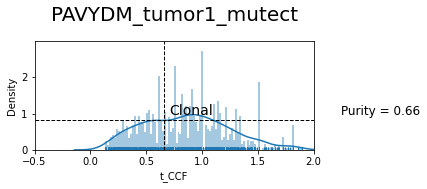

0.7169213339087965 1.0302308544379803


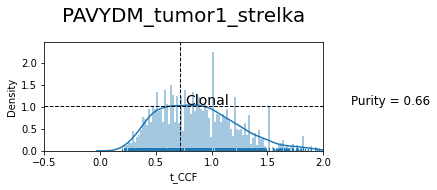

-0.07025897101994968 0.00014073180625061247


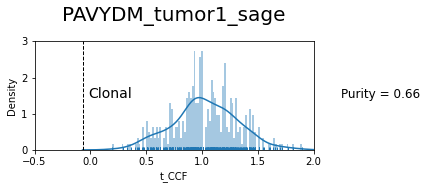

0.5785075173482969 0.6398611014883604


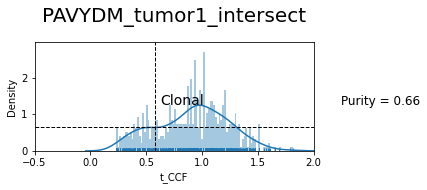

-0.21389979629710207 0.000368658592411025


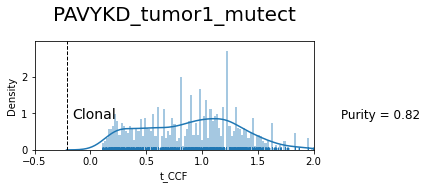

-0.10730981783878757 0.00016194207710258906


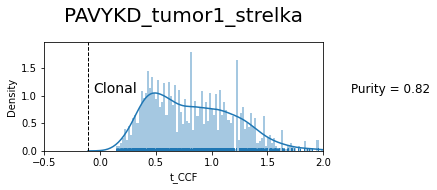

0.12684319384447784 0.0001611487447030675


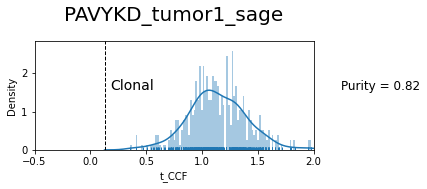

0.5166528108518299 0.24823643579804164


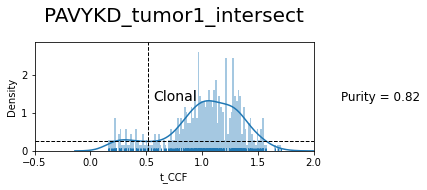

0.8824676558230671 0.263790151060642


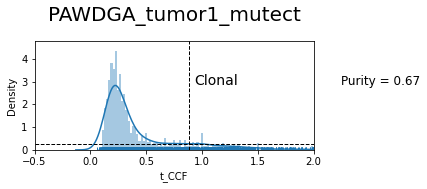

-0.1354001046227032 0.0002179399897148449


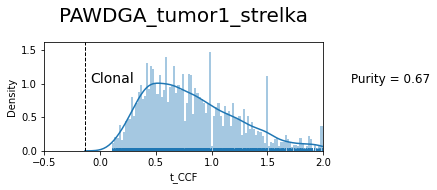

-0.08740908609402548 7.593299567439583e-05


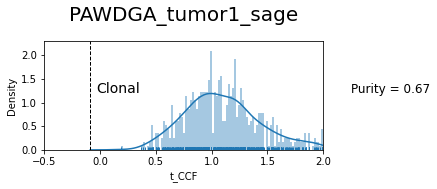

-0.13991286573434222 0.00017777886042699348


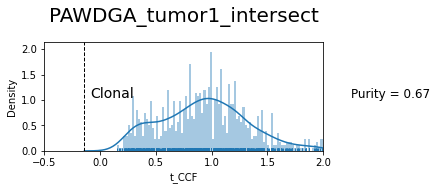

0.5179712452952413 0.44293787651061234


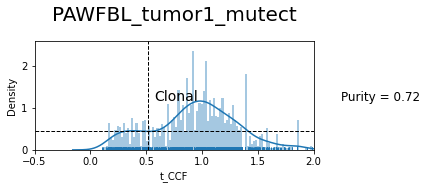

-0.11190044797907706 2.94515522062555e-05


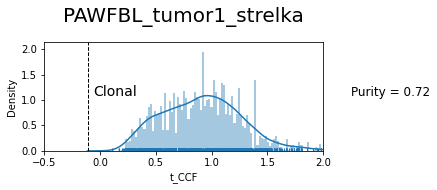

0.1258002661039806 9.740624998103865e-05


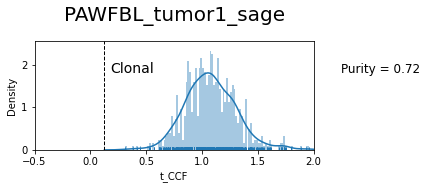

0.48124079257314556 0.17081197522463962


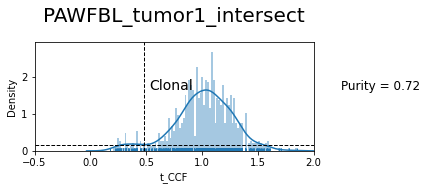

0.5633514635406234 0.6552845942994776


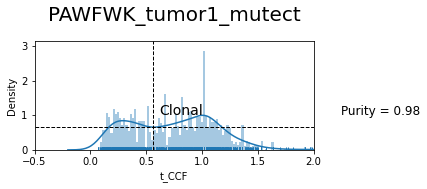

0.746470134133302 0.7837891716861262


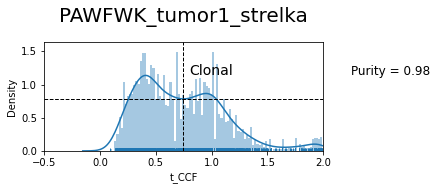

0.4377316645984141 0.18613018882382737


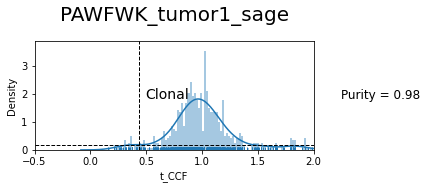

0.4948420011291507 0.3486050633202765


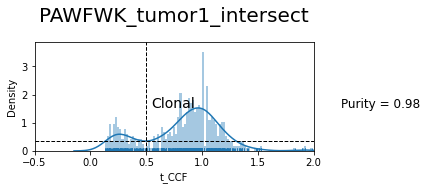

0.7978256688726594 0.4672548974801809


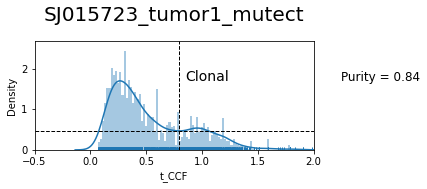

-0.07804498910861526 2.146190769257606e-05


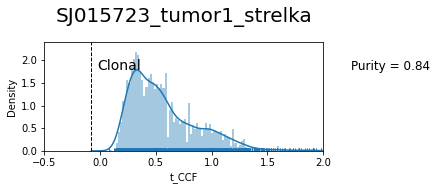

0.5305913764178356 0.4106663904184942


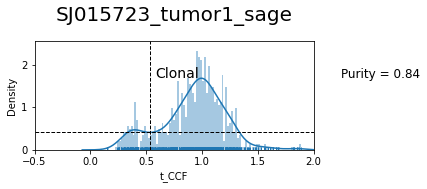

0.5952203790855268 0.41003002467042343


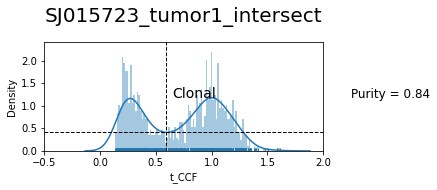

-0.2528395610950864 0.0009105681081235268


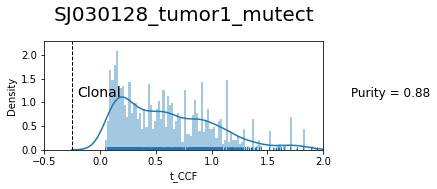

-0.23269469559333406 0.00010671088068255428


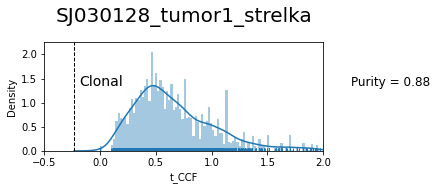

-0.16976396824711065 0.0005656164233785095


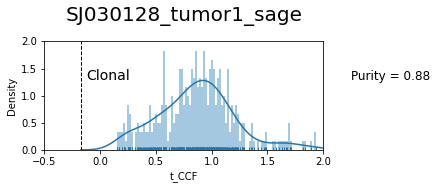

0.4357044585897636 0.5117814143493643


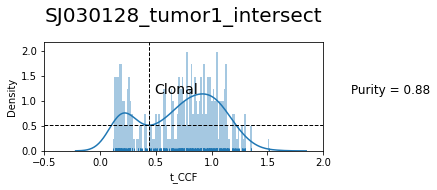

0.5117881382468691 0.3660150644751072


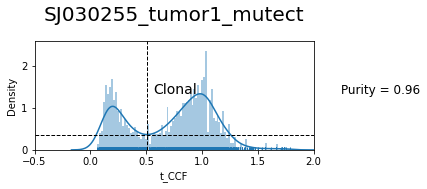

0.6041543683275794 0.6540384493205064


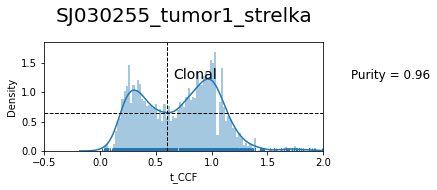

0.4332132202278895 0.09254633696441525


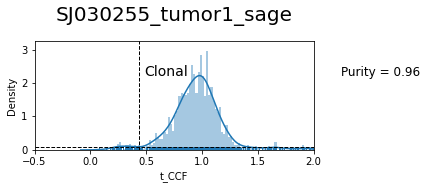

0.46612033207229975 0.14268397375239264


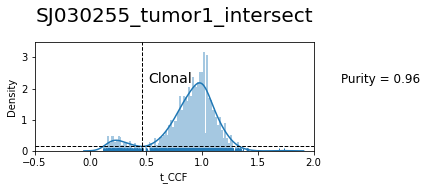

0.5250511955125376 0.3004878331352781


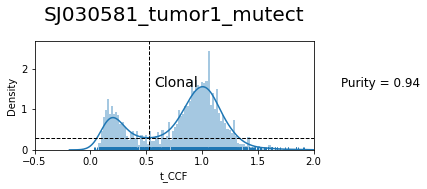

0.6049635390402011 0.5924520575549052


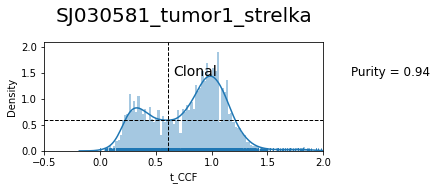

0.24668227398528017 0.014855490799336296


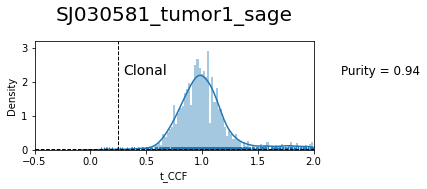

0.4684090466636787 0.035635170867093856


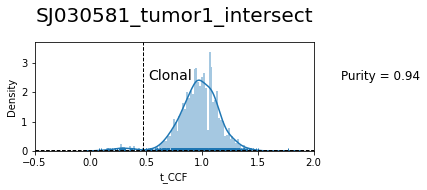

0.9021366440067535 0.5826065357234335


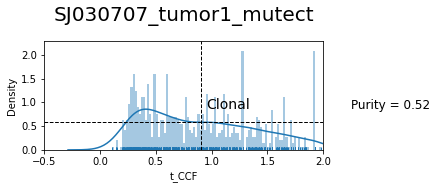

-0.05936259797012211 6.508525103635582e-05


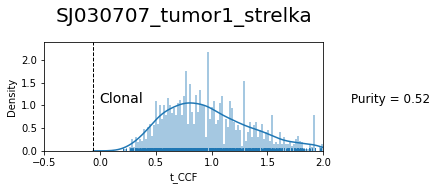

0.09184298066387847 0.0003865298572835353


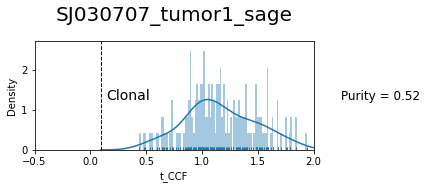

-0.09910346458991226 0.0006858638484805946


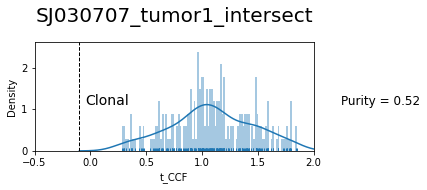

0.5967998029053078 0.7169035247355919


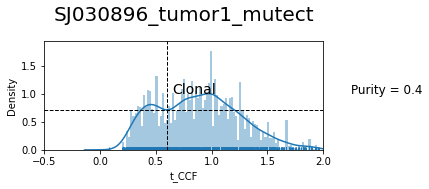

0.09114282287566178 0.001021028069458014


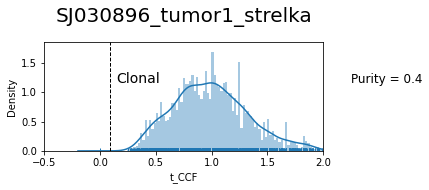

-0.023162160444376134 5.4123911472617044e-05


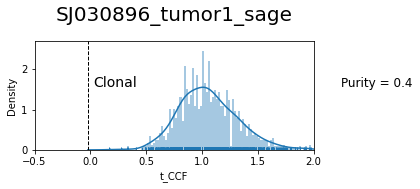

0.07791596037868742 0.0001357557788364672


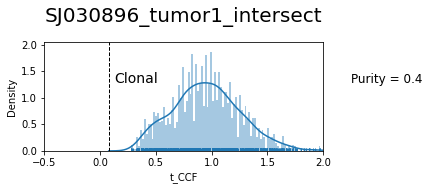

0.628013684168176 0.45569661221031976


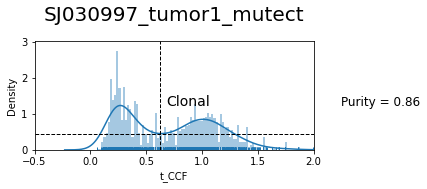

0.7570031779657683 0.6998365293580298


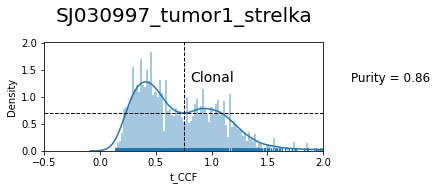

-0.03171591542736957 0.00018696166180073894


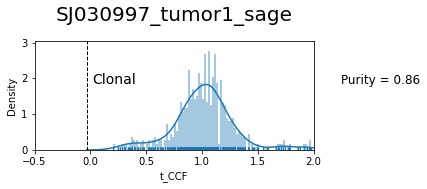

0.5743682884095815 0.3443061384042854


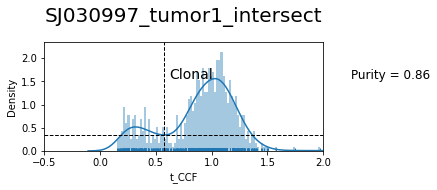

0.8408845002199761 0.082554573282412


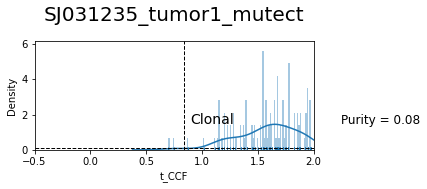

0.8223850960474102 0.0008920625850782135


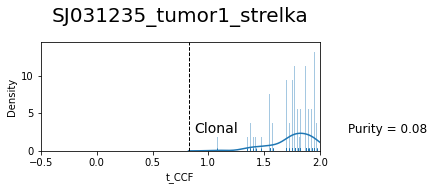

0.8538320844995655 0.14428544598479953


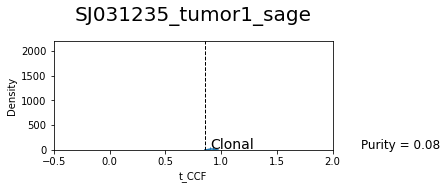

1.1066267900311302 0.002255858646321894


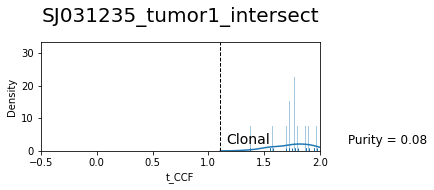

0.7633807207042262 0.11400846871202854


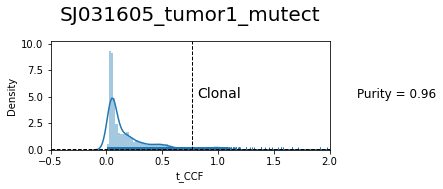

0.6985395454406278 0.47225244275221084


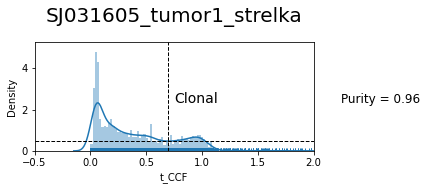

0.7464383130760486 0.1763547710411217


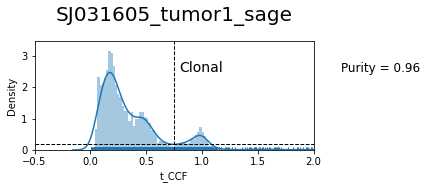

0.7691542739605657 0.020610293276298212


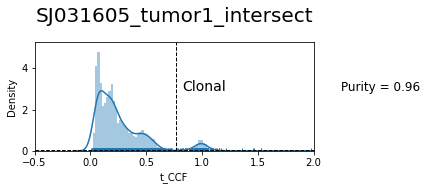

0.40839650336095834 0.34906413015546167


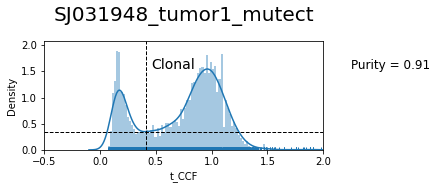

0.454735262140193 0.4523096512296066


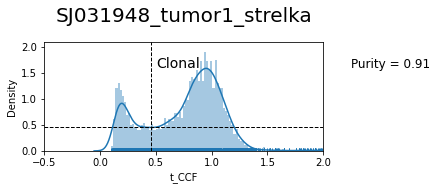

0.3530332247645026 0.2393617296882684


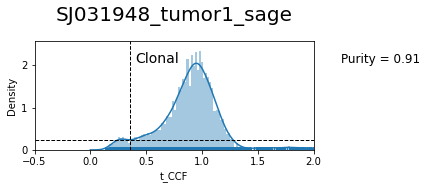

0.3971780209448803 0.3048545244156603


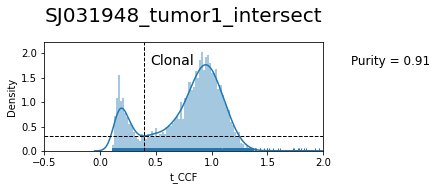

0.4814618550203076 0.3777000189057685


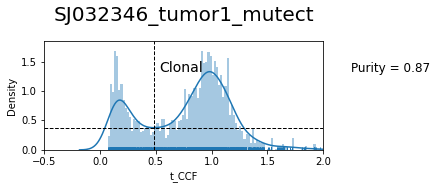

0.5586134032925439 0.6189306856130837


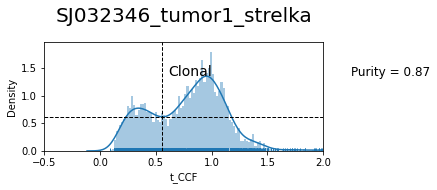

-0.14496332831321296 4.933324451574261e-05


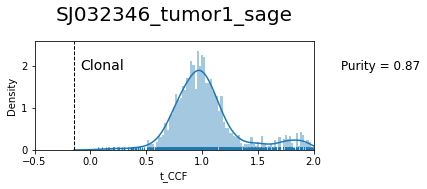

0.3957679694930384 0.06541912570267405


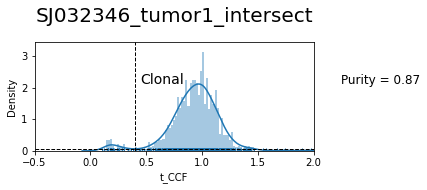

0.5499745839785695 0.405358374040092


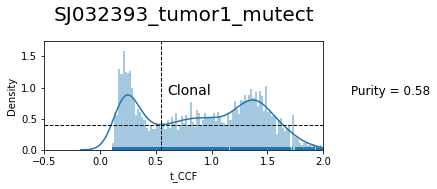

0.53233269977775 0.5061608301115379


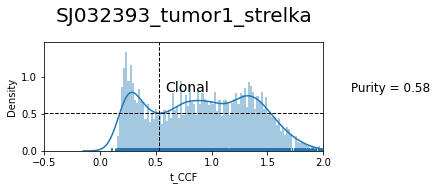

-0.10190113334811311 3.4294928801818e-05


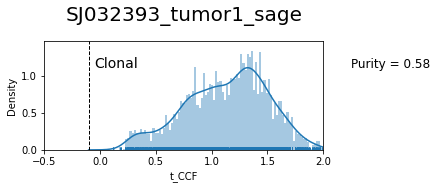

0.5234326868356421 0.4459237369040824


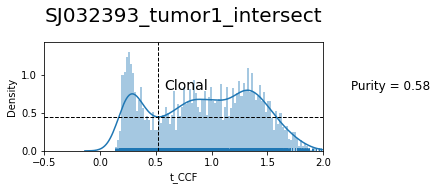

0.6069269389595511 0.31662808992775854


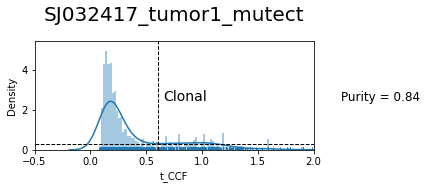

-0.11750012324518093 0.00082263888170716


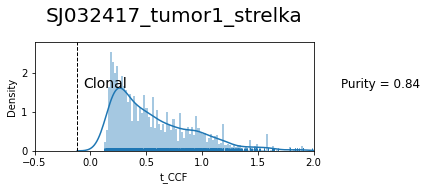

-0.22705929084963927 0.00021296154785565866


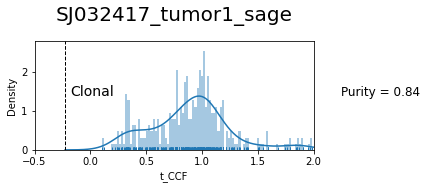

0.6491628926618597 0.39216791013739494


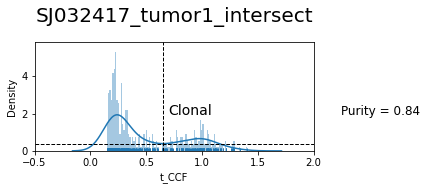

0.5941410862019706 0.5392056214502374


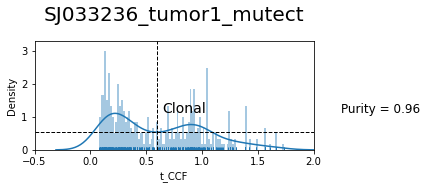

-0.1486746389655264 0.0002591510826997463


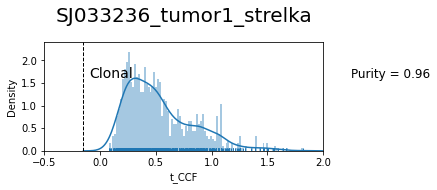

0.453126756365244 0.29665721873426737


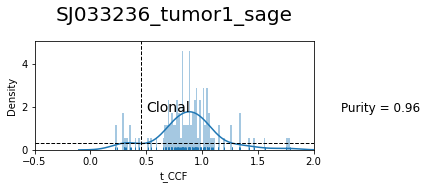

0.5303825610000972 0.45607362892069336


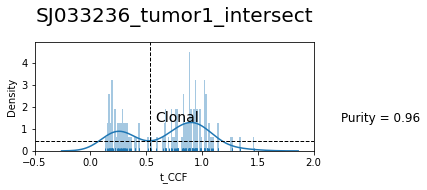

0.8382737687582957 0.551470654981844


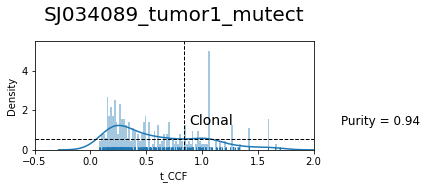

-0.20692566444152566 0.0005110618239059138


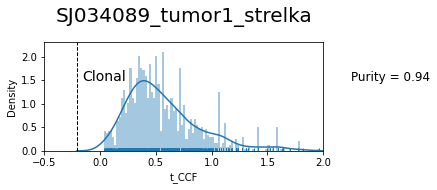

-0.42473757080396507 0.0005897246204739142


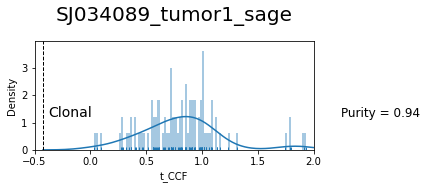

0.5588387566051221 0.7304041762154571


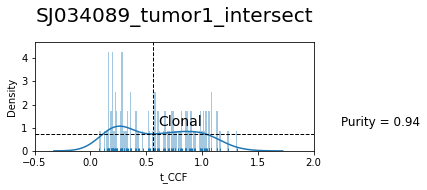

0.7265733749682777 0.5037937018664193


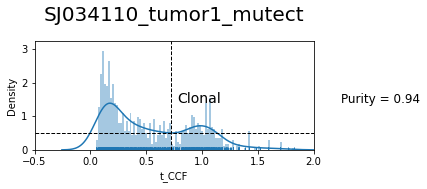

0.8052144245178076 0.5257451336393577


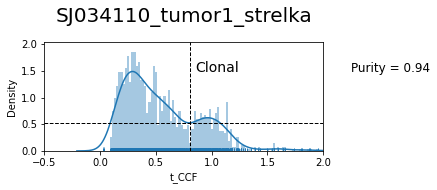

-0.2884115422822509 0.00010014498875787303


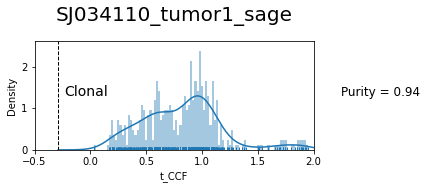

0.6971049376858606 0.7129781265555794


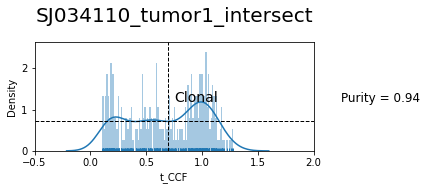

-0.09006515742913629 0.0001273915107794698


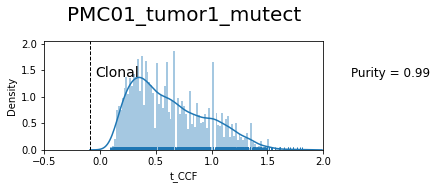

-0.087579452558369 1.8454160664462084e-05


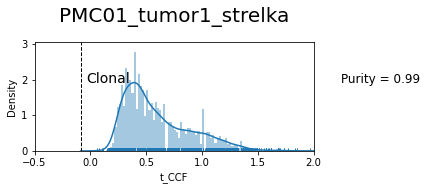

0.7600166771586532 1.1552530572154265


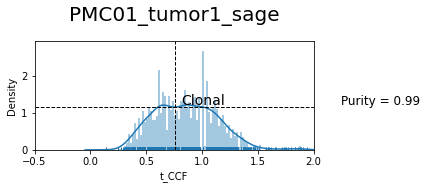

0.5643093893195593 1.1636278021470476


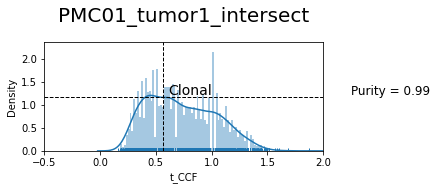

0.7408892595570924 0.4490027004201196


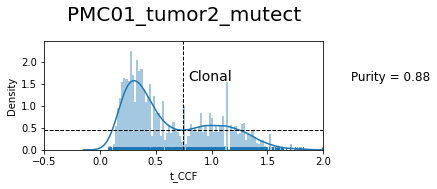

0.8557758966652625 0.4719054432781415


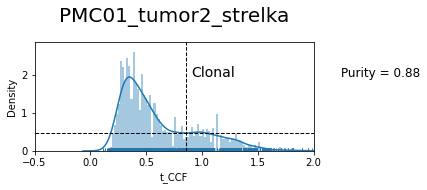

0.5877219779521305 0.3133557836054029


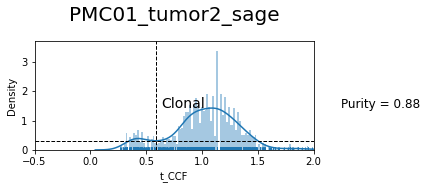

0.6493593710170357 0.36561738281593953


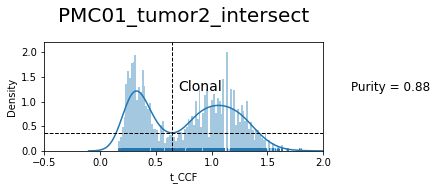

0.9397290839566071 0.42516255935174346


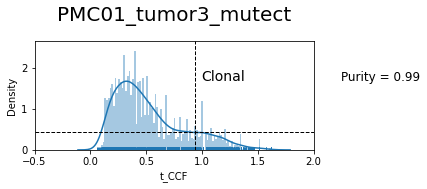

-0.1433467894400609 1.4229464802000798e-05


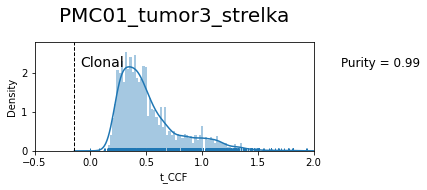

0.7910075231618416 0.8782204082261748


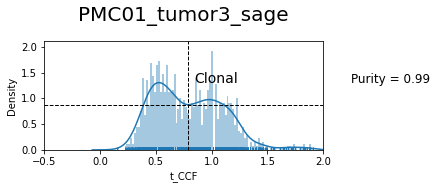

0.8289525779014408 0.5681044387474804


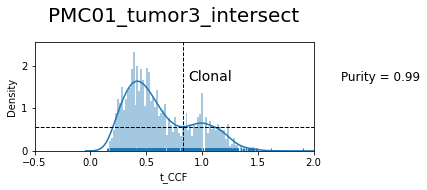

0.7798821733436349 0.39810503723345353


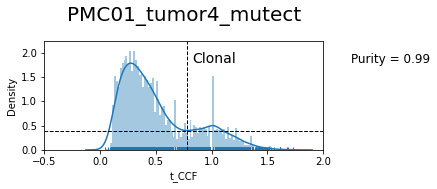

0.8594027989926212 0.3967374177398412


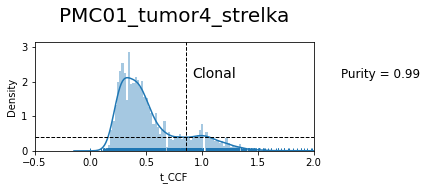

0.7271156770891343 0.6719100242423786


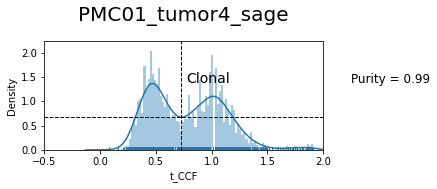

0.7367237128135292 0.5034095260698561


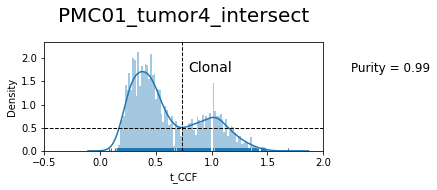

In [35]:
for sample_id in df_dict.keys():
    y_var = 't_CCF'
    title = sample_id
    data = df_dict[sample_id]
    data = data.drop_duplicates(['#CHROM','POS','REF','ALT'])
    if 'intersect' in sample_id:
        data = data[data['gnomADg_AF']<0.001]
        data.reset_index(inplace=True)
        data.drop('index',inplace=True,axis=1)
    sample = sample_id.split('_')[0]
    density_plot (data,y_var,title,sample,xlim_min=-0.5,xlim_max=2, bins=100,pur_pos=2.25,vaf=False)
    plt.show()

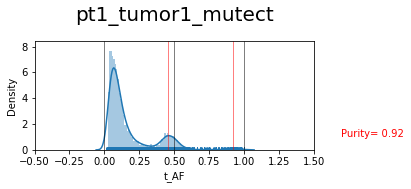

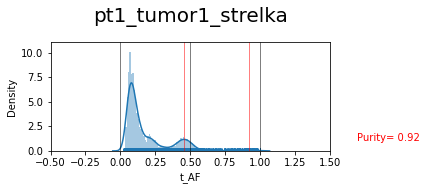

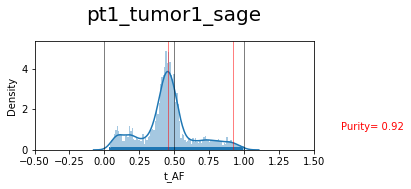

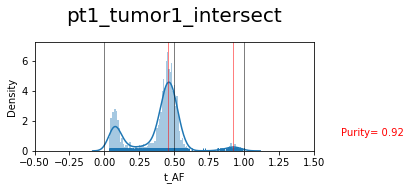

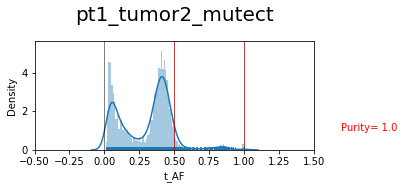

...

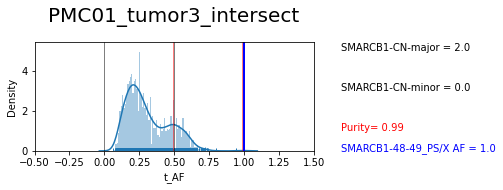

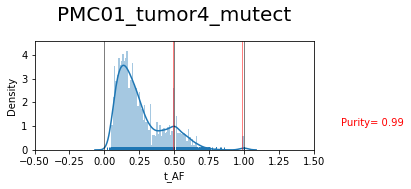

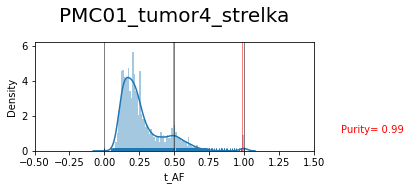

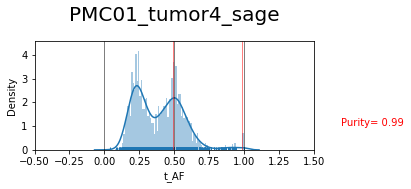

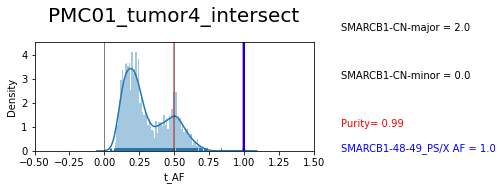

In [36]:
for sample_id in df_dict.keys():
    y_var = 't_AF'
    title = sample_id
    data = df_dict[sample_id]
    data = data.drop_duplicates(['#CHROM','POS','REF','ALT'])
    if 'intersect' in sample_id:
        data = data[data['gnomADg_AF']<0.001]
        data.reset_index(inplace=True)
        data.drop('index',inplace=True,axis=1)
    sample = ''
    density_plot (data,y_var,title,sample,xlim_min=-0.5,xlim_max=1.5, bins=100,pur_pos=2.25,vaf=True)
    plt.axvline(0,color='k',linewidth=0.5)
    plt.axvline(0.5,color='k',linewidth=0.5)
    plt.axvline(1,color='k',linewidth=0.5)
    purity = data['purity'][0]
    plt.axvline(0.5*purity,color='r',linewidth=0.5)
    plt.axvline(purity,color='r',linewidth=0.5)
    plt.text(1.7,1,s='Purity= '+str(purity),color='r')
    if 'SYMBOL' in data.columns:
        smarcb1_muts_list = data[['SYMBOL','t_AF','Protein_position','Amino_acids']][data['SYMBOL']=='SMARCB1'].values.tolist()
        smarca4_muts_list = data[['SYMBOL','t_AF','Protein_position','Amino_acids']][data['SYMBOL']=='SMARCA4'].values.tolist()       
        if smarcb1_muts_list != []:
            n = 0
            for s in smarcb1_muts_list:
                smarcb1_mut = s[2]+'_'+s[3]
                smarcb1_af = s[1]
                plt.text(1.7,n,s='SMARCB1-'+smarcb1_mut+' AF = '+str(smarcb1_af),color='b')
                plt.axvline(smarcb1_af,color='b',linewidth=2)
                n = n-1
            smarcb1_cn_list = data[['SYMBOL','nMinor','nMajor']][data['SYMBOL']=='SMARCB1'].values.tolist()
            smarcb1_major = smarcb1_cn_list[0][1]
            smarcb1_minor = smarcb1_cn_list[0][2]
            plt.text(1.7,3,s='SMARCB1-CN-minor = '+str(smarcb1_minor),color='k')
            plt.text(1.7,5,s='SMARCB1-CN-major = '+str(smarcb1_major),color='k')
        if smarca4_muts_list != []:
            n = 0
            for s in smarca4_muts_list:
                smarca4_mut = s[2]+'_'+s[3]
                smarca4_af = s[1]
                plt.text(3,n,s='SMARCA4-'+smarca4_mut+' AF = '+str(smarca4_af),color='g')
                plt.axvline(smarca4_af,color='g',linewidth=2)
                n = n-1
            smarca4_cn_list = data[['SYMBOL','nMinor','nMajor']][data['SYMBOL']=='SMARCA4'].values.tolist()
            smarca4_major = smarca4_cn_list[0][1]
            smarca4_minor = smarca4_cn_list[0][2]
            plt.text(3,3,s='SMARCA4-CN-minor = '+str(smarca4_minor),color='k')
            plt.text(3,5,s='SMARCA4-CN-major = '+str(smarca4_major),color='k')
            
    plt.show()

### Re-calculate t_CCF thresholds with some manually annotated threhsolds

In [37]:
#Assign manually t_CCF threshold for clonality for some samples after exploring VAF plots
clonality_dict = {'pt7_t1' : 0,
                  'pt9_t1' : 0,
                  'pt14_t2' : 0,
                  'pt20_t1' : 0,
                  'PASCDH':0.6,
                  'PAJNER':0.0,
                  'PAKHTL':0.6,
                  'PATVDL':0.6,
                  'PATENH':0.6,
                  'PAVYDM':0,
                  'PARECB':0.6,
                  'PARIRN':0.6,
                  'SJ031605': 0.6,
                  'SJ033133': 0.0,
                  'DIAF': 0.65,
                  'LN':0.75,
                  'HK': 0.0,
                  'pt3_clone1': 0.6,
                  'pt3_clone2': 0.6,
                  'pt6_clone1': 0.6,
                  'pt6_clone2': 0.6,
                  'pt14_clone1': 0.6,
                  'pt14_clone2': 0.6}

In [42]:
samples_dict['PMC01']

{'tumor1': 'DIAF',
 'tumor2': 'OMEN',
 'tumor3': 'LN',
 'tumor4': 'LNMETA',
 'normal': 'BLOOD',
 'normal2': 'HK'}

0.48200064508028906 0.10490956937185231


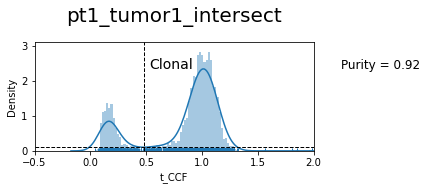

0.48405963033650523 0.07464113680873337


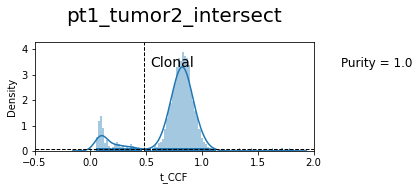

0.5913436416620546 0.209952353685929


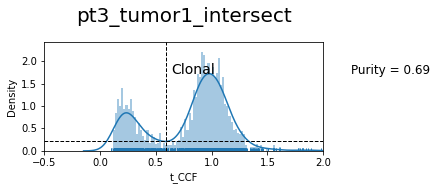

0.40535916391991067 0.0867853802109009


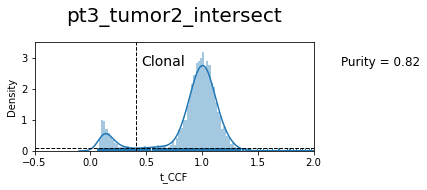

0.6 0


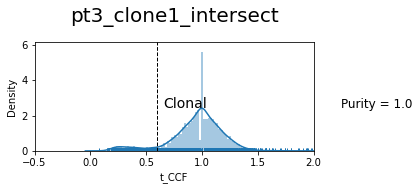

0.6 0


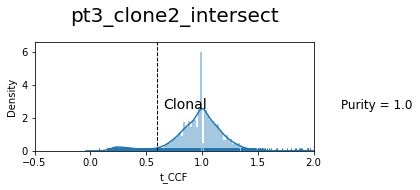

0.6628438576598452 0.14604630504312116


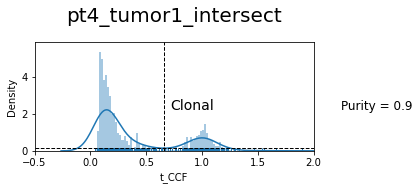

0.6240953910731797 0.34983082976375446


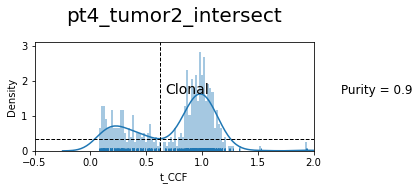

0.5926526787594651 0.07305996118899066


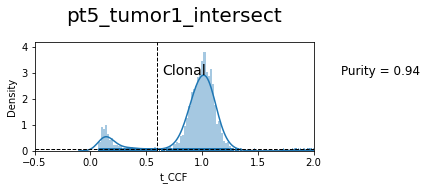

0.6418625956943032 0.27848638630744527


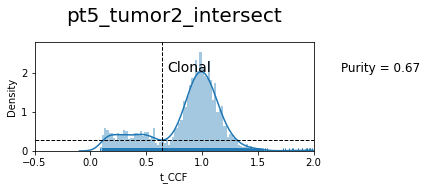

0.3675290823516746 0.0718933968540315


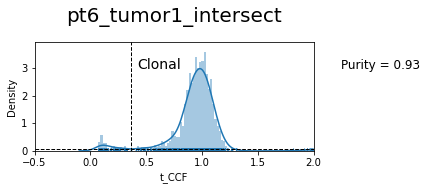

0.5019399724427036 0.27460863896270815


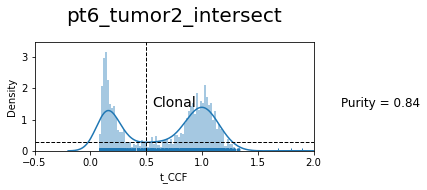

0.6 0


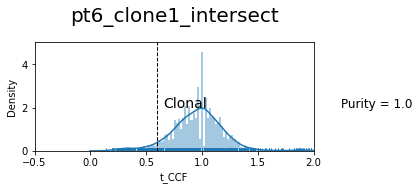

0.6 0


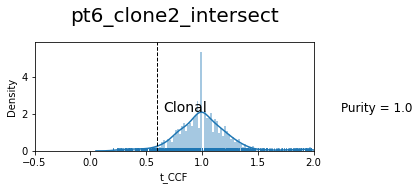

0 0


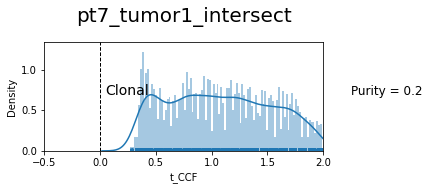

0.3767643218120238 0.35510417351869056


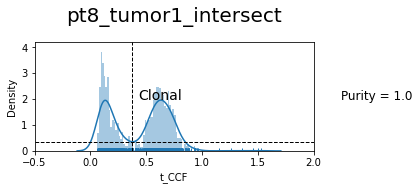

0 0


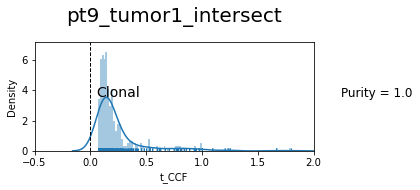

0.687652418452004 0.2157622744045354


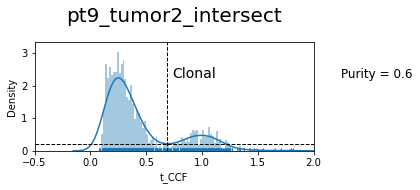

0.7133767393769176 0.2297978759150156


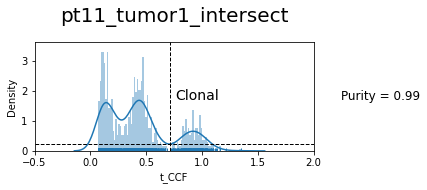

0.7518280417199147 0.04192266288902545


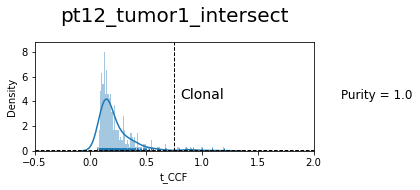

0.4865166270121998 0.09185785085976618


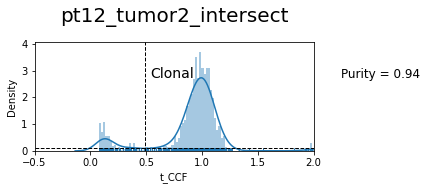

0.6570796433239896 0.15187897842520834


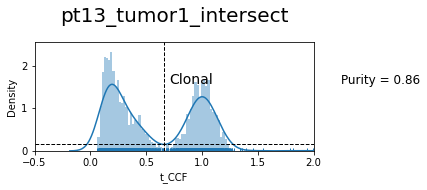

0.5258632665905252 0.3212850924019284


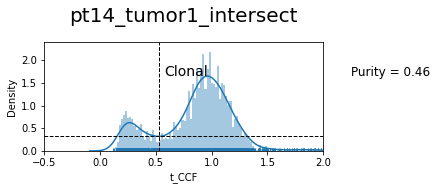

0 0


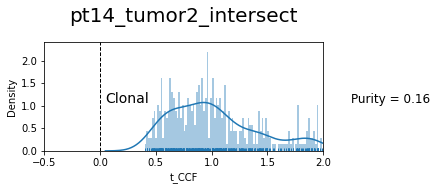

0.6 0


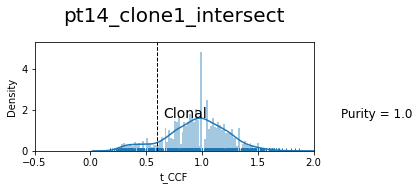

0.6 0


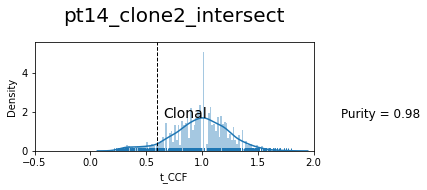

0.49428826307716456 0.14616823918677146


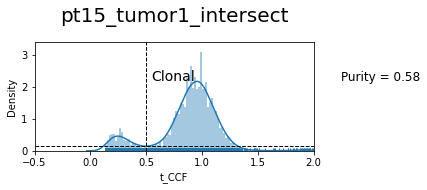

0.5110551402656732 0.2702985765991342


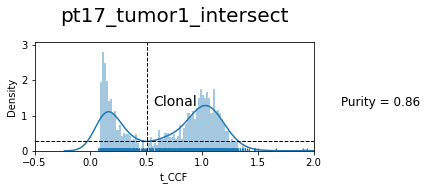

0.6591147553661884 0.1327641867002971


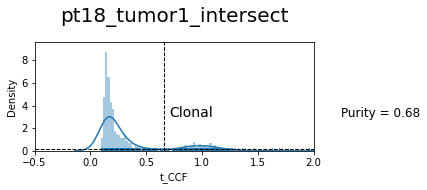

0.7294395959150162 0.21987574662106715


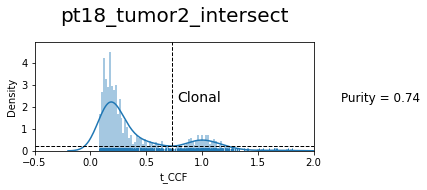

0.5866432460928503 0.06737508732995157


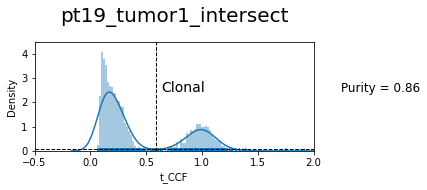

-0.016553830291787558 9.214124138894071e-05


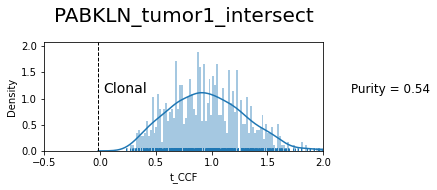

0.38186434396849833 0.20992590020039062


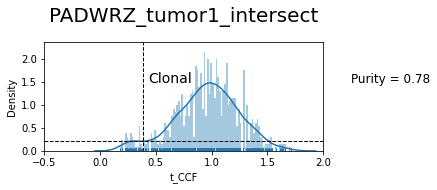

0.5270467758327126 0.38607997932045107


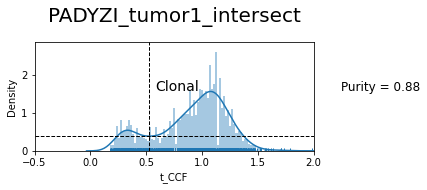

0.6136605920514078 0.7233199565636624


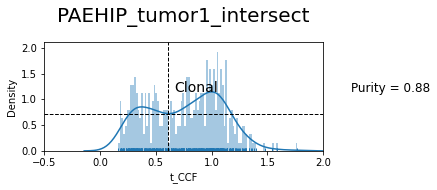

0.5439031937928784 0.4090008516604999


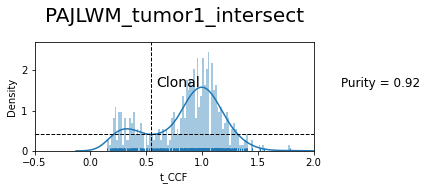

0.04663548620891039 0.0002918307873983441


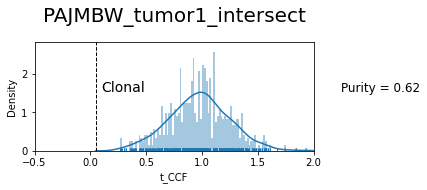

-0.09437365418690796 0.0001395443761850129


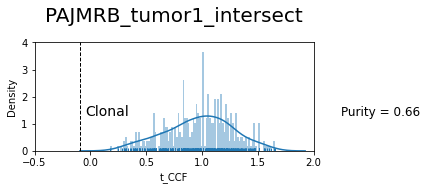

0.0 0


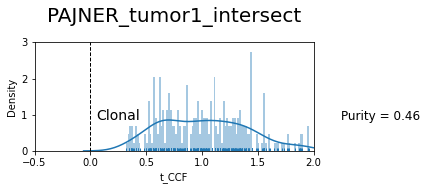

0.5294004973021721 0.6581478757187021


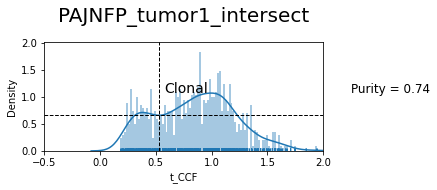

-0.01346959389643676 0.00034081730088391646


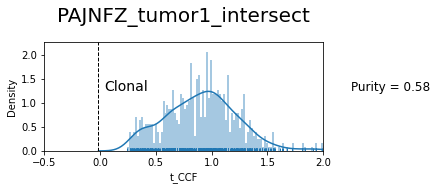

0.6 0


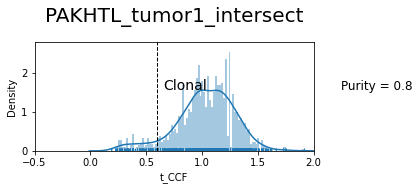

0.5422016475549726 0.39399002140221057


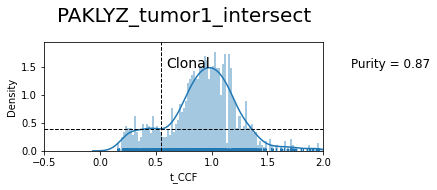

0.4325991680088626 0.12170467995257599


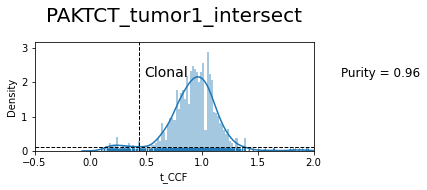

0.6 0


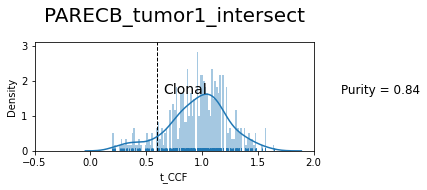

0.6156329332743884 0.45051441996342656


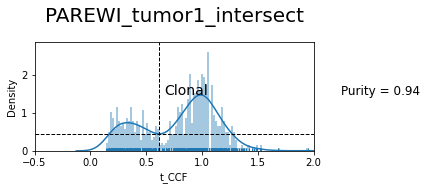

0.6108328652549955 0.3718622487963695


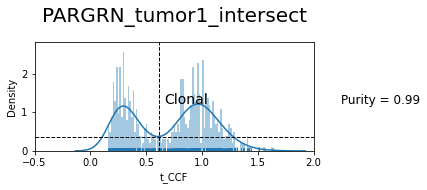

0.6 0


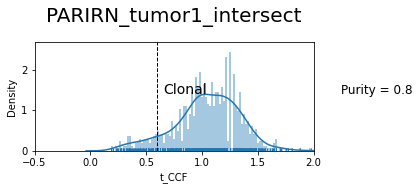

0.5525247130529137 0.4850884523263028


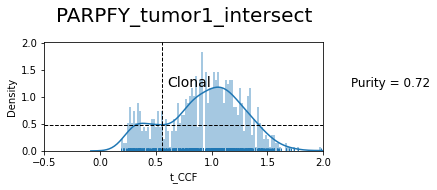

-0.017140887819567158 0.0003220246517354332


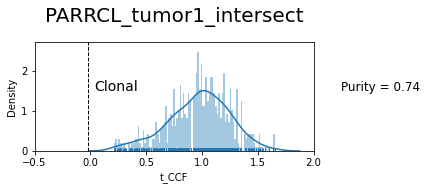

0.02305285229989154 0.00017770429942909148


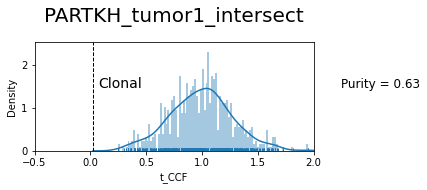

0.02557265095933131 0.0001316364005041894


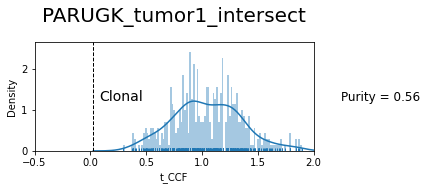

-0.00798853226400456 0.0004223636876733051


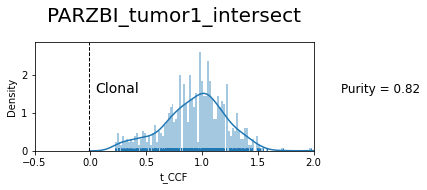

0.405838053395004 0.10326905614591832


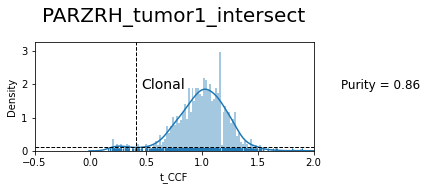

0.5884125115910095 0.6598472191324316


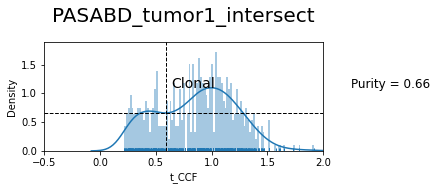

0.46334256400823676 0.12447524683769369


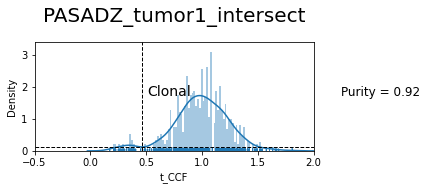

0.6 0


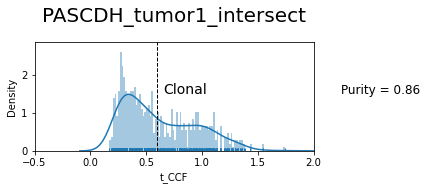

0.508967063973676 0.3136008336634092


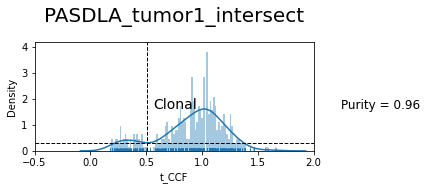

0.028464017508791684 0.00023819182831389874


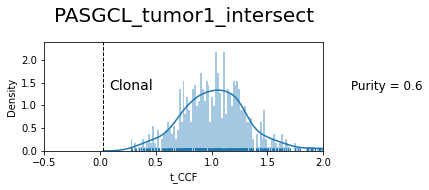

-0.10132573314171031 0.0005311921750545721


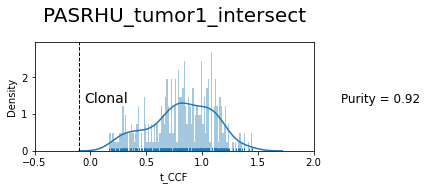

0.46906381792883467 0.31830399895993927


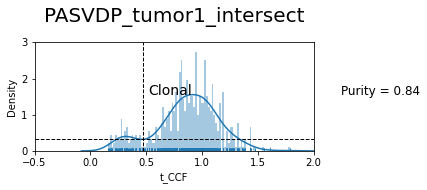

0.5919745817835961 0.3720660076622949


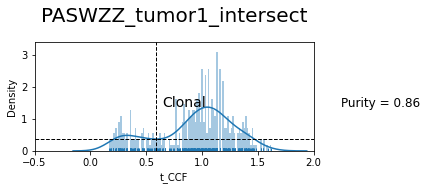

0.4258446244929238 0.13993936171907675


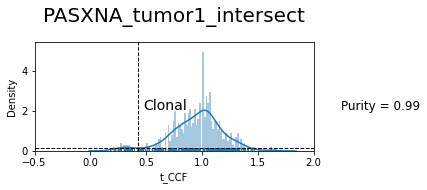

-0.12290806824275824 0.00043734694982200314


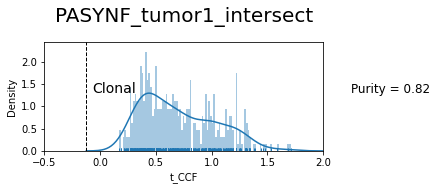

-0.055488456089742066 0.00034683371931632927


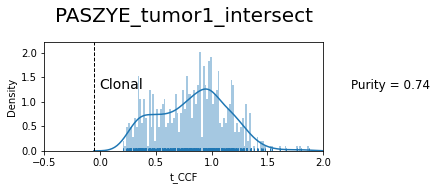

0.5377843760445342 0.5943589933526292


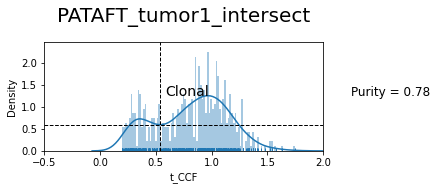

0.02137681686288803 0.00017957599558384574


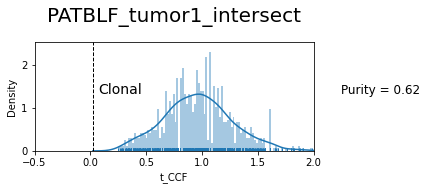

0.45386009282494855 0.14945874470974813


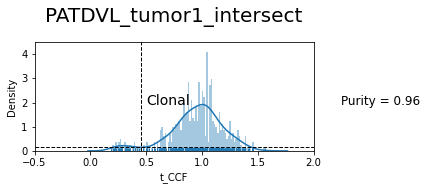

0.6 0


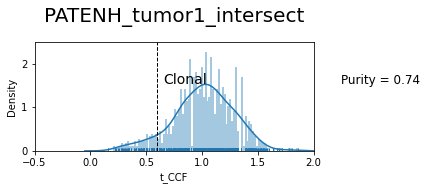

0.4920719720260124 0.3718966553715821


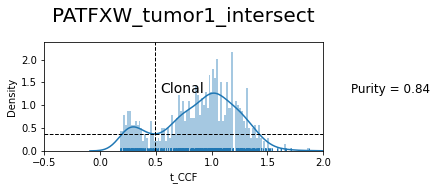

0.4759166771226876 0.45496518183515566


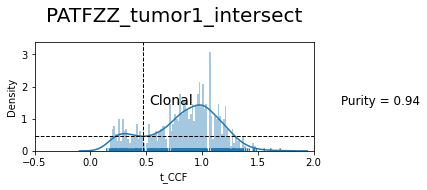

0.7334083946904887 0.6861348086699244


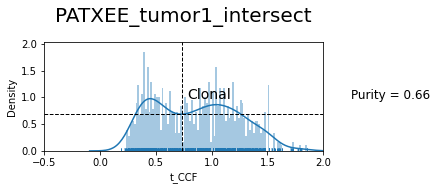

-0.11385590057965778 0.00031199189807328784


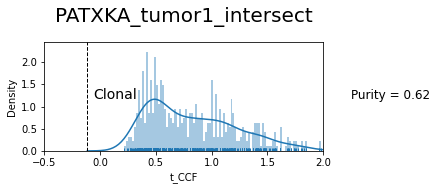

-0.18689277022266995 8.438916290246351e-05


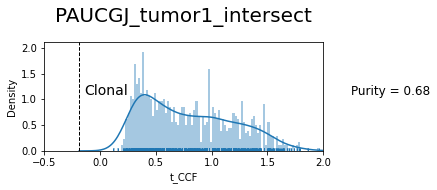

-0.14318222272503092 0.0015161227650877203


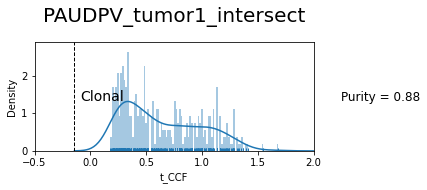

0.40607548824223266 0.12310728281545773


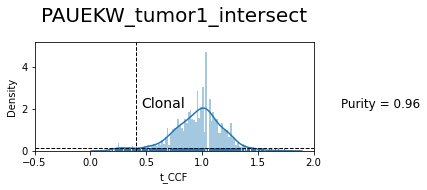

0.556823401279975 0.18409300281238128


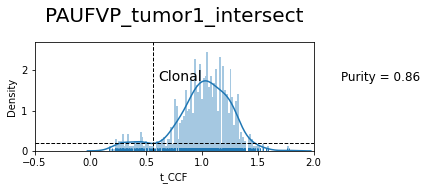

0.5036144940834278 0.36578478673728715


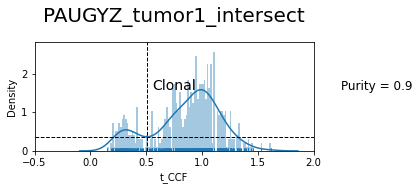

0.5692126901748182 0.4202480227026233


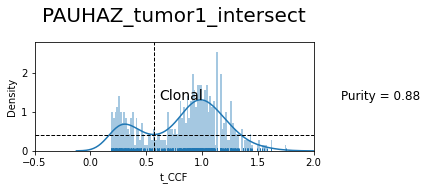

-0.006342892130614286 7.587154617475562e-05


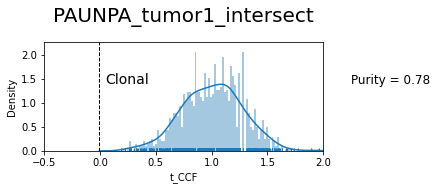

0.4594584272817004 0.08561891222955567


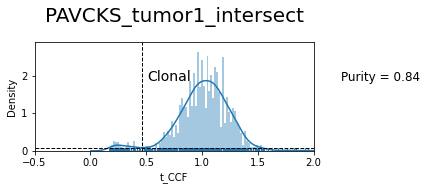

-0.02194231681753786 0.00019563290076286393


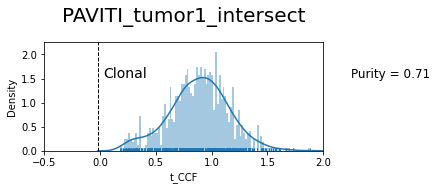

0 0


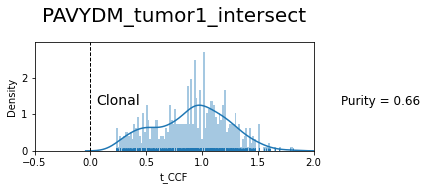

0.5166528108518299 0.24823643579804164


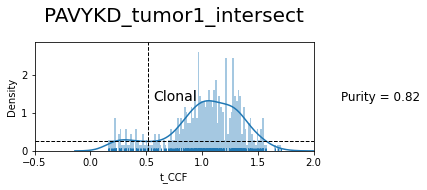

-0.13991286573434222 0.00017777886042699348


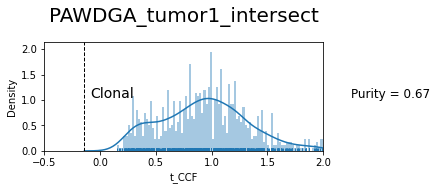

0.48124079257314556 0.17081197522463962


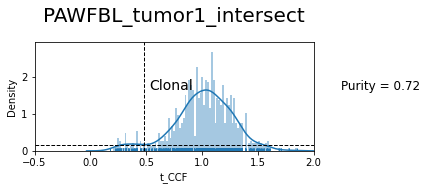

0.4948420011291507 0.3486050633202765


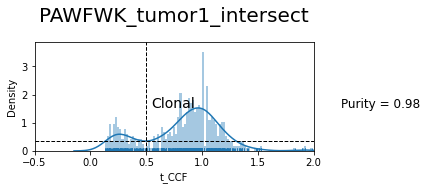

0.5952203790855268 0.41003002467042343


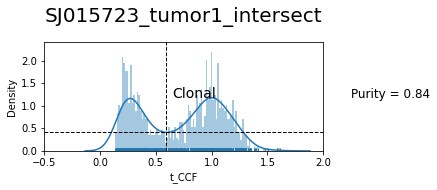

0.4357044585897636 0.5117814143493643


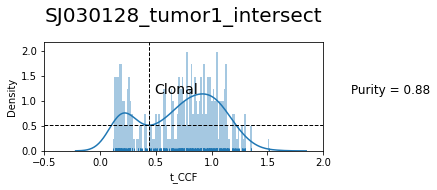

0.46612033207229975 0.14268397375239264


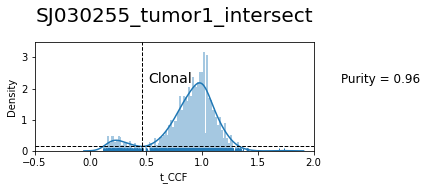

0.4684090466636787 0.035635170867093856


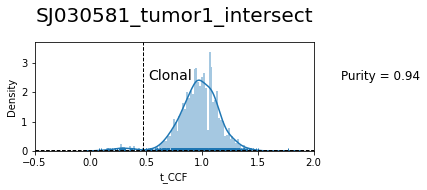

-0.09910346458991226 0.0006858638484805946


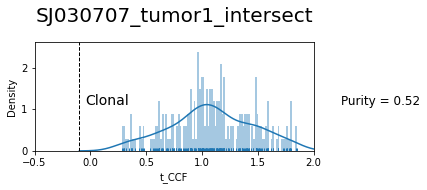

0.07791596037868742 0.0001357557788364672


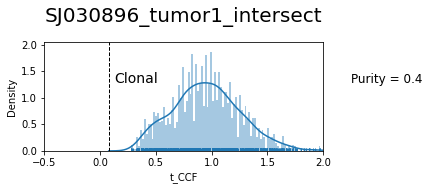

0.5743682884095815 0.3443061384042854


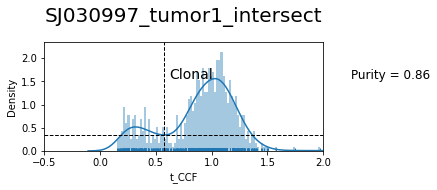

1.1066267900311302 0.002255858646321894


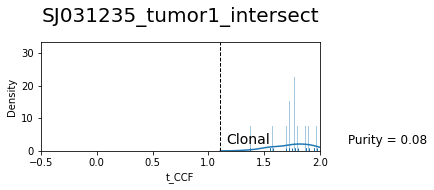

0.6 0


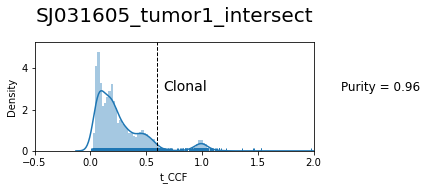

0.3971780209448803 0.3048545244156603


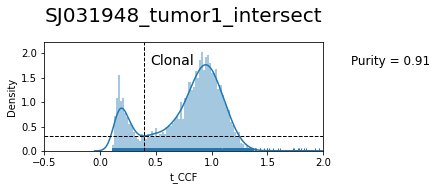

0.3957679694930384 0.06541912570267405


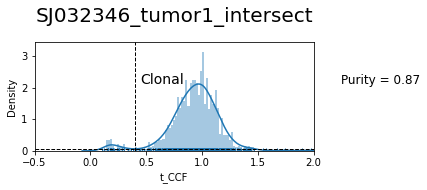

0.5234326868356421 0.4459237369040824


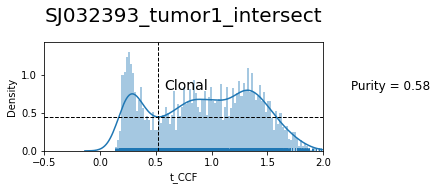

0.6491628926618597 0.39216791013739494


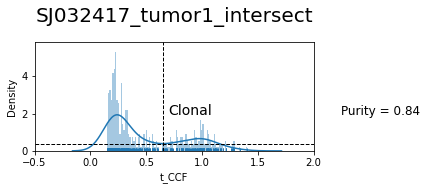

0.5303825610000972 0.45607362892069336


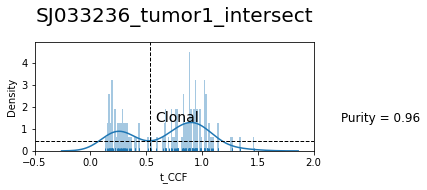

0.5588387566051221 0.7304041762154571


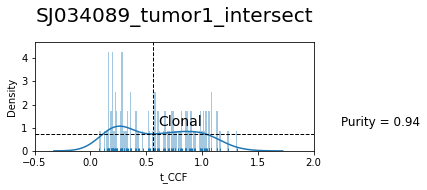

0.6971049376858606 0.7129781265555794


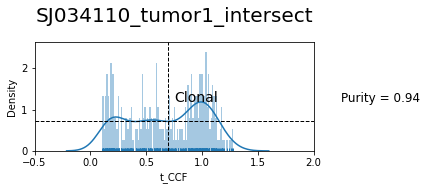

0.65 0


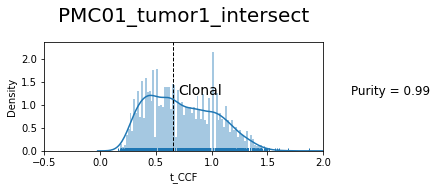

0.6493593710170357 0.36561738281593953


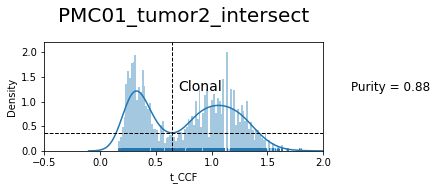

0.75 0


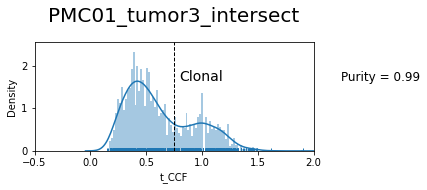

0.7367237128135292 0.5034095260698561


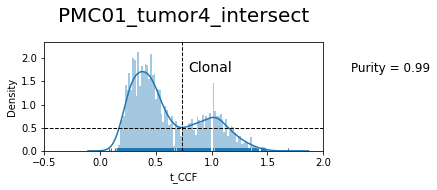

{'pt1_t1': 0.48200064508028906,
 'pt1_t2': 0.48405963033650523,
 'pt3_t1': 0.5913436416620546,
 'pt3_t2': 0.40535916391991067,
 'pt3_clone1': 0.6,
 'pt3_clone2': 0.6,
 'pt4_t1': 0.6628438576598452,
 'pt4_t2': 0.6240953910731797,
 'pt5_t1': 0.5926526787594651,
 'pt5_t2': 0.6418625956943032,
 'pt6_t1': 0.3675290823516746,
 'pt6_t2': 0.5019399724427036,
 'pt6_clone1': 0.6,
 'pt6_clone2': 0.6,
 'pt7_t1': 0,
 'pt8_t1': 0.3767643218120238,
 'pt9_t1': 0,
 'pt9_t2': 0.687652418452004,
 'pt11_t1': 0.7133767393769176,
 'pt12_t1': 0.7518280417199147,
 'pt12_t2': 0.4865166270121998,
 'pt13_t1': 0.6570796433239896,
 'pt14_t1': 0.5258632665905252,
 'pt14_t2': 0,
 'pt14_clone1': 0.6,
 'pt14_clone2': 0.6,
 'pt15_t1': 0.49428826307716456,
 'pt17_t1': 0.5110551402656732,
 'pt18_t1': 0.6591147553661884,
 'pt18_t2': 0.7294395959150162,
 'pt19_t1': 0.5866432460928503,
 'PABKLN': -0.016553830291787558,
 'PADWRZ': 0.38186434396849833,
 'PADYZI': 0.5270467758327126,
 'PAEHIP': 0.6136605920514078,
 'PAJLWM': 0

In [69]:
thresholds = {}
for sample_id in df_dict.keys():
    y_var = 't_CCF'
    title = sample_id
    data = df_dict[sample_id]
    data = data.drop_duplicates(['#CHROM','POS','REF','ALT'])
    if 'intersect' in sample_id:
        data = data[data['gnomADg_AF']<0.001]
        data.reset_index(inplace=True)
        data.drop('index',inplace=True,axis=1)
        if sample_id.startswith('pt'):
            if sample_id.split('_')[1].startswith('clone'):
                tumor_id = sample_id.split('_')[1]
            else:
                tumor_id = sample_id.split('_')[1][0] + sample_id.split('_')[1][-1]
            sample = sample_id.split('_')[0] +'_'+ tumor_id
        elif sample_id.startswith('PA') or sample_id.startswith('SJ'):
            sample = sample_id.split('_')[0]
        elif sample_id.startswith('PMC'):
            pmc_samples_dict = samples_dict['PMC01']
            sample = pmc_samples_dict[sample_id.split('_')[1]]
        threshold = density_plot (data,y_var,title,sample,xlim_min=-0.5,xlim_max=2, bins=100,pur_pos=2.25,vaf=False,clonality_dict=clonality_dict)
        plt.show()
        thresholds[sample] = threshold
thresholds       

In [70]:
thresholds

{'pt1_t1': 0.48200064508028906,
 'pt1_t2': 0.48405963033650523,
 'pt3_t1': 0.5913436416620546,
 'pt3_t2': 0.40535916391991067,
 'pt3_clone1': 0.6,
 'pt3_clone2': 0.6,
 'pt4_t1': 0.6628438576598452,
 'pt4_t2': 0.6240953910731797,
 'pt5_t1': 0.5926526787594651,
 'pt5_t2': 0.6418625956943032,
 'pt6_t1': 0.3675290823516746,
 'pt6_t2': 0.5019399724427036,
 'pt6_clone1': 0.6,
 'pt6_clone2': 0.6,
 'pt7_t1': 0,
 'pt8_t1': 0.3767643218120238,
 'pt9_t1': 0,
 'pt9_t2': 0.687652418452004,
 'pt11_t1': 0.7133767393769176,
 'pt12_t1': 0.7518280417199147,
 'pt12_t2': 0.4865166270121998,
 'pt13_t1': 0.6570796433239896,
 'pt14_t1': 0.5258632665905252,
 'pt14_t2': 0,
 'pt14_clone1': 0.6,
 'pt14_clone2': 0.6,
 'pt15_t1': 0.49428826307716456,
 'pt17_t1': 0.5110551402656732,
 'pt18_t1': 0.6591147553661884,
 'pt18_t2': 0.7294395959150162,
 'pt19_t1': 0.5866432460928503,
 'PABKLN': -0.016553830291787558,
 'PADWRZ': 0.38186434396849833,
 'PADYZI': 0.5270467758327126,
 'PAEHIP': 0.6136605920514078,
 'PAJLWM': 0

In [ ]:
sjd_thresholds = {k:v for k,v in thresholds.items() if k.startswith('pt') and 'clone' not in k}
clones_thresholds = {k:v for k,v in thresholds.items() if k.startswith('pt') and 'clone' in k}
target_thresholds = {k:v for k,v in thresholds.items() if k.startswith('PA')}
stjude_thresholds = {k:v for k,v in thresholds.items() if k.startswith('SJ')}
pmc_thresholds = {k:v for k,v in thresholds.items() if k not in list(sjd_thresholds.keys())+ list(target_thresholds.keys()) + list(stjude_thresholds.keys())}

{'pt3_clone1': 0.6,
 'pt3_clone2': 0.6,
 'pt6_clone1': 0.6,
 'pt6_clone2': 0.6,
 'pt14_clone1': 0.6,
 'pt14_clone2': 0.6}

In [ ]:
# json.dump(sjd_thresholds, open( "ccf_thresholds_sjd.json", "w" ) )
# json.dump(clones_thresholds, open( "ccf_thresholds_sjd_clones.json", "w" ) )
# json.dump(target_thresholds, open( "ccf_thresholds_target.json", "w" ) )
# json.dump(stjude_thresholds, open( "ccf_thresholds_stjude.json", "w" ) )
# json.dump(pmc_thresholds, open( "ccf_thresholds_pmc_case.json", "w" ) )

## TMB clonal muts

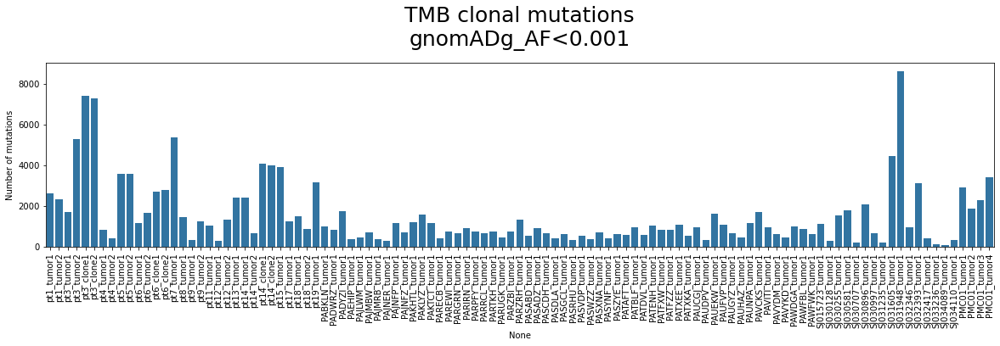

In [82]:
sample_final = {}
for sample_id in df_dict:
    if 'intersect' in sample_id:        
        sample_df = df_dict[sample_id]
        if sample_id.startswith('pt') and 'clone' not in sample_id:
            tumor_id = sample_id.split('_')[0]+'_'+sample_id.split('_')[1][0]+sample_id.split('_')[1][-1]
        elif sample_id.startswith('PA') or sample_id.startswith('SJ'):
            tumor_id = sample_id.split('_')[0]
        elif sample_id.startswith('PMC'):
            pmc_samples_dict = samples_dict['PMC01']
            tumor_id = pmc_samples_dict[sample_id.split('_')[1]]
        else:
            tumor_id = sample_id.split('_intersect')[0]
        threshold = thresholds[tumor_id]
        sammple_df = sample_df[sample_df['t_CCF']>threshold]
        sample_id2 = sample_id.split('_intersect')[0]
        sample_final[sample_id2] = len(sample_df[['#CHROM','POS','REF','ALT']][sample_df['gnomADg_AF']<0.001].drop_duplicates())
tum_burden_df = pd.DataFrame.from_dict(sample_final,orient='index',columns=['Number of mutations'])
plt.figure(figsize=(20,4))
sns.barplot(x=tum_burden_df.index,y=tum_burden_df['Number of mutations'])
plt.title('TMB clonal mutations\ngnomADg_AF<0.001',size=25,pad=20)
plt.xticks(rotation=90)
plt.show()